In [1]:
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle
import pymc3 as pm
import seaborn as sns
import theano
import theano.tensor as tt
import unidecode
import warnings

from sklearn import preprocessing
from scipy import stats
from typing import List, Set, Tuple

%matplotlib inline
sns.set()
warnings.simplefilter(action='ignore', category=FutureWarning)
print(f'Running on PyMC3 v{pm.__version__}, Theano v.{theano.__version__} and Pandas v{pd.__version__}')

Running on PyMC3 v3.7, Theano v.1.0.4 and Pandas v0.25.1


In [2]:
RANDOM_SEED = 20090425
AFFILIATIONS = {'farleft': ['arthaud', 'besancenot', 'buffet', 'gluckstein', 'hue', 'laguiller', 'mélenchon', 'poutou',
                           'LFG', 'FG', 'FI', 'BC-FG', 'LXG', 'LEXG', 'EXG', 'BC-EXG', 'LCOP', 'LPC', 'LCOM', 'COM', 'BC-COM', 
                            'LUTTE OUVRIERE ET LCR', 'LUTTE OUVRIERE', "BOUGE L'EUROPE", 'PARTI DES TRAVAILL.', 'PCF'], 
                'left': ['hamon', 'hollande', 'jospin', 'royal', 'LUG', 'LSOC', 'LPS', 'SOC', 'BC-SOC', 'BC-UG', 'LGA',
                        'CONSTRUISONS NOTRE EUROPE', 'EUROPE SOLIDAIRE'], 
                'green': ['bové', 'cohn-bendit', 'joly', 'mamere', 'voynet', 'LVEC', 'LVE', 'LVEG', 'LEC', 'VEC', 'BC-VEC', 'LECO', 'ECO',
                         "L'ECOLOGIE, LES VERTS", 'ECOLOGIE  CHOIX DE LA VIE', 'UNION DES ECOLOG.', 'GENERATION ECOLOGIE'], 
                'center': ['balladur', 'bayrou', 'macron', 'REM', 'LUC', 'LCMD', 'MDM', 'LUDF', 'UDF', 'UDFD', "AVEC L'EUROPE", 
                           'ENERGIE RADICALE', 'AUTRE EUROPE'], 
                'right': ['chirac', 'fillon', 'sarkozy', 'LR', 'LUMP', 'LUD', 'LMAJ', 'UDI', 'BC-UDI', 'UMP', 'BC-UMP', 'BC-UD', 'LDR',
                          "L'UNION POUR L'EUROPE", 'UDF-RPR', 'RPR', 'M-NC', 'M'],
                'farright': ['le pen', 'LFN', 'FN', 'FRN', 'BC-FN', 'FRONT NATIONAL']}

DATES_ELECTIONS = {'dep1992': pd.to_datetime('1992-03-22'), 'dep1994': pd.to_datetime('1994-03-20'),
                   'dep1998': pd.to_datetime('1998-03-15'), 'dep2001': pd.to_datetime('2001-03-11'),
                   'dep2004': pd.to_datetime('2004-03-21'), 'dep2008': pd.to_datetime('2008-03-09'),
                   'dep2011': pd.to_datetime('2011-03-20'), 'dep2015': pd.to_datetime('2015-03-22'),
                   'euro1994': pd.to_datetime('1994-06-12'), 'euro1999': pd.to_datetime('1999-06-13'),
                   'euro2004': pd.to_datetime('2004-06-13'), 'euro2009': pd.to_datetime('2009-06-07'), 
                   'euro2014': pd.to_datetime('2014-05-25'),
                   'leg1993': pd.to_datetime('1993-03-21'), 'leg1997': pd.to_datetime('1997-05-25'),
                   'leg2002': pd.to_datetime('2002-06-09'), 'leg2007': pd.to_datetime('2007-06-10'),
                   'leg2012': pd.to_datetime('2012-06-10'), 'leg2017': pd.to_datetime('2017-06-11'),
                   'pres1974': pd.to_datetime('1974-05-05'), 'pres1988': pd.to_datetime('1988-04-24'),
                   'pres1995': pd.to_datetime('1995-04-23'), 'pres2002': pd.to_datetime('2002-04-21'), 
                   'pres2007': pd.to_datetime('2007-04-22'), 'pres2012': pd.to_datetime('2012-04-22'), 
                   'pres2017': pd.to_datetime('2017-04-23'),
                   'reg1998': pd.to_datetime('1998-03-15'), 'reg2004': pd.to_datetime('2004-03-21'), 
                   'reg2010': pd.to_datetime('2010-03-14'), 'reg2015': pd.to_datetime('2015-12-06')}

#FOND_FOLDER = "C:/Users/D818090/Privé/euro/fondamentaux/"
FOND_FOLDER = '/Users/alexandreandorra/repos/contesdefaits/modeles/euro/fondamentaux'
#REG_FOLDER = "C:/Users/D818090/Privé/euro/fondamentaux/regressors"
REG_FOLDER = '/Users/alexandreandorra/repos/contesdefaits/modeles/fondamentaux'
#RESULTS_FOLDER = "C:/Users/D818090/Privé/euro/fondamentaux/results"
RESULTS_FOLDER = '/Users/alexandreandorra/repos/contesdefaits/modeles/fondamentaux/'#election_results_1st_round'

In [3]:
def uniformise(x: str) -> str:
    '''
    Uniformise les départements pour pouvoir fusionner les dataframes des différentes élections.
    En détail, la fonction lowercase les départements, et enlève les accents, les tirets, les espaces,
    et les apostrophes
    '''
    x = x.lower()
    x = unidecode.unidecode(x) # remove accents
    x = x.replace('-', '')
    x = x.replace(' ', '')
    x = x.replace("'", '')
    x = x.replace('francaisetablishorsdefrance', 'francaisdeletranger')
    x = x.replace('corsedusud', 'corsesud')
    
    return x

# EDA

## Import the regressors

Popularité, incumbent, PIB, chômage, inflation, confiance des ménages, essence

In [5]:
chomage_depart_trim = pd.read_excel(os.path.join(REG_FOLDER, 'chomage_depart_trim.xls'), sheet_name='Département',
                                    header=3, skip_footer=4).iloc[:, 1:].T

chomage_depart_trim.columns = chomage_depart_trim.iloc[0].apply(lambda x: uniformise(x)).values
chomage_depart_trim = chomage_depart_trim[1:] # skip first line

as_q = pd.PeriodIndex(start=chomage_depart_trim.index[0][3:], periods=len(chomage_depart_trim.index), freq='Q')
as_q = as_q.to_timestamp() + pd.offsets.QuarterEnd(0)
chomage_depart_trim = chomage_depart_trim.set_index(as_q).sort_index()
# https://stackoverflow.com/questions/46350531/pandas-converting-index-of-yyyyqq-values-to-datetime-object
# https://stackoverflow.com/questions/45088085/pandas-convert-date-quarters-to-datetime-object
# https://pandas.pydata.org/pandas-docs/stable/generated/pandas.Period.strftime.html

chomage_depart_trim = chomage_depart_trim.T.sort_index().T
chomage_depart_trim = chomage_depart_trim.astype(float)
chomage_depart_trim.tail()

,ain,aisne,allier,alpesdehauteprovence,alpesmaritimes,ardeche,ardennes,ariege,aube,aude,...,territoiredebelfort,valdemarne,valdoise,var,vaucluse,vendee,vienne,vosges,yonne,yvelines
2017-06-30,6.8,13.0,10.0,11.3,10.1,10.2,11.2,11.5,12.0,12.5,...,9.8,8.2,9.4,10.5,11.9,7.1,7.5,10.2,8.8,6.8
2017-09-30,6.9,13.5,10.2,11.6,10.3,10.5,11.2,12.0,12.1,12.8,...,9.6,8.6,9.8,10.6,12.2,7.4,7.7,10.3,8.9,7.3
2017-12-31,6.2,12.6,9.4,10.9,9.6,10.0,10.3,11.3,11.2,12.0,...,8.5,7.9,9.1,10.0,11.6,6.8,7.0,9.4,8.2,6.7
2018-03-31,6.4,12.7,9.7,11.4,10.0,10.2,10.5,11.5,11.6,12.3,...,9.0,8.2,9.3,10.4,11.9,6.9,7.2,9.5,8.4,6.9
2018-06-30,6.3,12.5,9.6,11.1,9.7,9.9,10.5,11.4,11.3,12.1,...,9.1,8.0,9.2,10.2,11.7,6.7,7.2,9.5,8.3,6.8


In [6]:
chomage_long = pd.DataFrame(chomage_depart_trim.stack())
chomage_long.columns = ['chomage']

chomage_long.reset_index(inplace=True)
chomage_long.rename(columns={'level_0': 'date', 'level_1': 'departement'}, inplace=True)
chomage_long = chomage_long.sort_values(['departement', 'date']).reset_index(drop=True)
chomage_long.tail()

,date,departement,chomage
14011,2017-06-30,yvelines,6.8
14012,2017-09-30,yvelines,7.3
14013,2017-12-31,yvelines,6.7
14014,2018-03-31,yvelines,6.9
14015,2018-06-30,yvelines,6.8


In [7]:
climat_affaires_nat_mois = pd.read_csv(os.path.join(REG_FOLDER, 'climat_affaires_nat_mois.csv'), engine='python', sep=';', 
                                       header=None, skiprows=3, usecols=[0,1], index_col=0, parse_dates=True)
climat_affaires_nat_mois.columns = ['climat_affaires']
climat_affaires_nat_mois.index = climat_affaires_nat_mois.index + pd.offsets.MonthEnd()
climat_affaires_nat_mois.index.name = 'time'
climat_affaires_nat_mois.head()

,climat_affaires
time,
2018-10-31,104.1
2018-09-30,105.5
2018-08-31,105.3
2018-07-31,106.1
2018-06-30,106.6


In [8]:
conf_menage_nat_mois = pd.read_csv(os.path.join(REG_FOLDER, 'conf_menage_nat_mois.csv'), engine='python', sep=';', 
                                   header=None, skiprows=3, usecols=[0,1], index_col=0, parse_dates=True)
conf_menage_nat_mois.columns = ['conf_menages']
conf_menage_nat_mois.index = conf_menage_nat_mois.index + pd.offsets.MonthEnd()
conf_menage_nat_mois.index.name = 'time'
conf_menage_nat_mois.head()

,conf_menages
time,
2018-10-31,95
2018-09-30,94
2018-08-31,96
2018-07-31,97
2018-06-30,97


In [9]:
gazole_nat_mois = pd.read_csv(os.path.join(REG_FOLDER, 'gazole_nat_mois.csv'), engine='python', sep=';',
                              header=None, skiprows=3, usecols=[0,1], index_col=0, parse_dates=True)
gazole_nat_mois.columns = ['prix_gazole']
gazole_nat_mois.index = gazole_nat_mois.index + pd.offsets.MonthEnd()
gazole_nat_mois.index.name = 'time'
gazole_nat_mois.head()

,prix_gazole
time,
2018-10-31,1.52
2018-09-30,1.48
2018-08-31,1.45
2018-07-31,1.45
2018-06-30,1.46


In [10]:
inflation_nat_an = pd.read_excel(os.path.join(REG_FOLDER, 'inflation_nat_an.xls'), header=3, skip_footer=3, index_col=0)
inflation_nat_an.index = pd.to_datetime(inflation_nat_an.index, format='%Y') + pd.offsets.YearEnd()
inflation_nat_an.columns = ['inflation']
inflation_nat_an.head()

,inflation
Année,
2017-12-31,1.0
2016-12-31,0.2
2015-12-31,0.0
2014-12-31,0.5
2013-12-31,0.9


In [13]:
pib_nat_trim = pd.read_excel(os.path.join(REG_FOLDER, 'pib_nat_trim.xls'), header=3, skip_footer=4, index_col=0,
                             usecols=[0,1]).dropna()
pib_nat_trim.columns = ['pib']
# https://stackoverflow.com/questions/40445076/how-to-convert-period-string-to-actual-period-type
pib_nat_trim.index = pd.to_datetime(pib_nat_trim.index.str.replace('-T', 'Q')) + pd.offsets.QuarterEnd(0)
#pib_nat_trim.index = pd.PeriodIndex(pib_nat_trim.index.str.replace('-T', 'Q'), freq='Q')
pib_nat_trim.head()

,pib
Trimestre,
2018-09-30,0.410939
2018-06-30,0.168449
2018-03-31,0.177458
2017-12-31,0.702508
2017-09-30,0.598786


In [14]:
with open('/Users/alexandreandorra/repos/contesdefaits/popularite/moving_averages/dict_of_dfs_of_presidents.pkl', 'rb') as f:
#with open(os.path.join(REG_FOLDER, 'dict_of_dfs_of_presidents.pkl'), 'rb') as f:
    pop_dict = pickle.load(f)

keep_cols = ['app_agg', 'disapp_agg']
pop_dfs = []

for p in list(pop_dict.keys())[:8]:
    pop_dfs.append(pd.DataFrame(data=pop_dict[p])[keep_cols])

pop_agg = pd.concat(pop_dfs)
pop_agg['net_app'] = pop_agg.app_agg - pop_agg.disapp_agg
pop_agg = pop_agg[['net_app']].round(2)
pop_agg.head()

,net_app
date,
1978-09-28,27.0
1978-09-30,27.0
1978-10-02,27.0
1978-10-04,27.0
1978-10-06,27.0


## Merge country- and department-level regressors

In [15]:
country_regs = pd.concat([climat_affaires_nat_mois, conf_menage_nat_mois, gazole_nat_mois, 
                          inflation_nat_an, pib_nat_trim, pop_agg], 
                         axis=1).fillna(method='ffill').dropna()
country_regs.tail()

,climat_affaires,conf_menages,prix_gazole,inflation,pib,net_app
2019-08-27,104.1,95.0,1.52,1.0,0.410939,-33.55
2019-08-29,104.1,95.0,1.52,1.0,0.410939,-31.89
2019-08-31,104.1,95.0,1.52,1.0,0.410939,-31.95
2019-09-02,104.1,95.0,1.52,1.0,0.410939,-31.95
2019-09-04,104.1,95.0,1.52,1.0,0.410939,-31.58


In [16]:
regressors = country_regs.merge(chomage_long, left_index=True, right_on='date')
regressors = regressors.set_index(['departement', 'date']).sort_index()
regressors.tail()

climat_affaires  conf_menages  prix_gazole  inflation  \
departement date                                                                
yvelines    2017-06-30            106.6         108.0         1.18        0.2   
            2017-09-30            109.2         102.0         1.22        0.2   
            2017-12-31            111.4         104.0         1.28        1.0   
            2018-03-31            109.5         100.0         1.37        1.0   
            2018-06-30            106.6          97.0         1.46        1.0   

                             pib  net_app  chomage  
departement date                                    
yvelines    2017-06-30  0.637134    18.58      6.8  
            2017-09-30  0.598786    -9.24      7.3  
            2017-12-31  0.702508    -7.61      6.7  
            2018-03-31  0.177458   -12.94      6.9  
            2018-06-30  0.168449   -17.04      6.8

## Standardize regressors

In [35]:
regressors_scaled = pd.DataFrame(data=preprocessing.scale(regressors), columns=regressors.columns, index=regressors.index)
regressors_scaled.tail()

climat_affaires  conf_menages  prix_gazole  inflation  \
departement date                                                                
yvelines    2017-06-30         0.643959      0.907208     0.769907  -1.655289   
            2017-09-30         0.891864      0.311765     0.909771  -1.655289   
            2017-12-31         1.101630      0.510246     1.119565  -0.636650   
            2018-03-31         0.920468      0.113284     1.434258  -0.636650   
            2018-06-30         0.643959     -0.184437     1.748950  -0.636650   

                             pib   net_app   chomage  
departement date                                      
yvelines    2017-06-30  0.525205  1.229137 -0.974242  
            2017-09-30  0.442997  0.157146 -0.728912  
            2017-12-31  0.665351  0.219955 -1.023308  
            2018-03-31 -0.460228  0.014574 -0.925176  
            2018-06-30 -0.479541 -0.143412 -0.974242

In [36]:
regressors_scaled.describe().round(2)

,climat_affaires,conf_menages,prix_gazole,inflation,pib,net_app,chomage
count,10176.00,10176.00,10176.00,10176.00,10176.00,10176.00,10176.00
mean,0.00,0.00,0.00,0.00,0.00,0.00,-0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-3.02,-1.87,-1.50,-1.91,-4.36,-2.03,-2.50
25%,-0.67,-0.78,-1.01,-0.76,-0.55,-0.69,-0.68
50%,0.07,-0.09,0.07,0.25,0.07,-0.03,-0.09
75%,0.77,0.71,0.91,0.76,0.67,0.85,0.55
max,1.77,2.30,1.75,2.16,1.86,1.78,3.44


In [37]:
regressors_scaled.corr().round(2).style.background_gradient(cmap="coolwarm", low=0.5)

,climat_affaires,conf_menages,prix_gazole,inflation,pib,net_app,chomage
climat_affaires,1,0.56,0.03,-0.41,0.68,0.3,-0.09
conf_menages,0.56,1,-0.62,-0.17,0.48,0.66,-0.08
prix_gazole,0.03,-0.62,1,-0.31,-0.2,-0.47,-0.01
inflation,-0.41,-0.17,-0.31,1,-0.33,0.17,-0.12
pib,0.68,0.48,-0.2,-0.33,1,0.21,0.08
net_app,0.3,0.66,-0.47,0.17,0.21,1,-0.2
chomage,-0.09,-0.08,-0.01,-0.12,0.08,-0.2,1


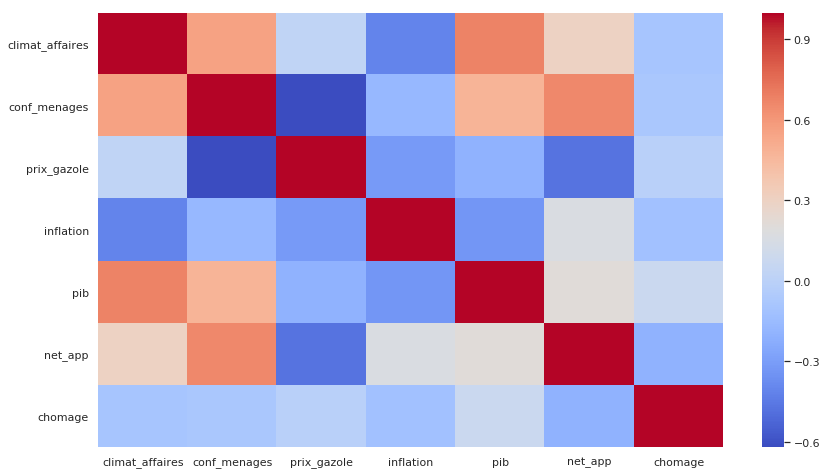

In [38]:
plt.figure(figsize=(14,8))
sns.heatmap(regressors_scaled.corr().round(2), cmap="coolwarm");

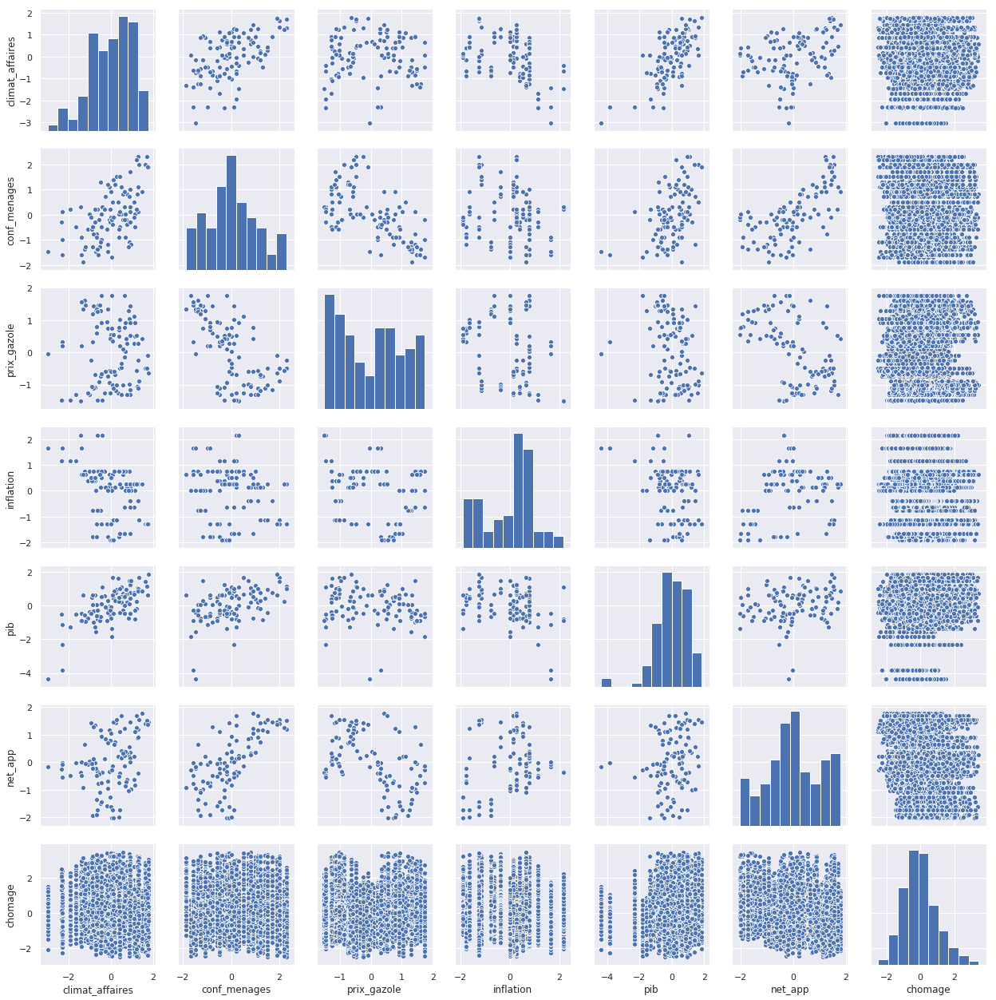

In [19]:
sns.pairplot(regressors_scaled);

# Resample regressors daily with forward fill, to match election dates later

In [17]:
chomage_depart_resamp = chomage_depart_trim.resample('D').ffill()

chomage_long_resamp = pd.DataFrame(chomage_depart_resamp.stack())
chomage_long_resamp.columns = ['chomage']
chomage_long_resamp.reset_index(inplace=True)
chomage_long_resamp.rename(columns={'level_0': 'date', 'level_1': 'departement'}, inplace=True)
chomage_long_resamp = chomage_long_resamp.sort_values(['departement', 'date']).reset_index(drop=True)

country_regs_resamp = country_regs.resample('D').ffill()

In [18]:
regs_resamp = country_regs_resamp.merge(chomage_long_resamp, left_index=True, right_on='date')
regs_resamp = regs_resamp.set_index(['departement', 'date']).sort_index()
regs_resamp.tail()

climat_affaires  conf_menages  prix_gazole  inflation  \
departement date                                                                
yvelines    2018-06-26            106.8          99.0         1.45        1.0   
            2018-06-27            106.8          99.0         1.45        1.0   
            2018-06-28            106.8          99.0         1.45        1.0   
            2018-06-29            106.8          99.0         1.45        1.0   
            2018-06-30            106.6          97.0         1.46        1.0   

                             pib  net_app  chomage  
departement date                                    
yvelines    2018-06-26  0.177458   -16.16      6.9  
            2018-06-27  0.177458   -16.16      6.9  
            2018-06-28  0.177458   -16.16      6.9  
            2018-06-29  0.177458   -17.04      6.9  
            2018-06-30  0.168449   -17.04      6.8

In [20]:
regs_resamp.reset_index().to_json('predictors_daily.json')

In [41]:
regs_resamp_scaled = pd.DataFrame(data=preprocessing.scale(regs_resamp), columns=regs_resamp.columns, index=regs_resamp.index)
regs_resamp_scaled.tail()

climat_affaires  conf_menages  prix_gazole  inflation  \
departement date                                                                
yvelines    2018-06-26         0.685707      0.017579     1.740393  -0.647086   
            2018-06-27         0.685707      0.017579     1.740393  -0.647086   
            2018-06-28         0.685707      0.017579     1.740393  -0.647086   
            2018-06-29         0.685707      0.017579     1.740393  -0.647086   
            2018-06-30         0.666344     -0.181139     1.775564  -0.647086   

                             pib   net_app   chomage  
departement date                                      
yvelines    2018-06-26 -0.466827 -0.121788 -0.921881  
            2018-06-27 -0.466827 -0.121788 -0.921881  
            2018-06-28 -0.466827 -0.121788 -0.921881  
            2018-06-29 -0.466827 -0.155424 -0.921881  
            2018-06-30 -0.486148 -0.155424 -0.970885

In [42]:
metropole = regs_resamp_scaled.index.get_level_values(0).unique().tolist() # metropolitan departments only
#metropole = regs_resamp.index.get_level_values(0).unique().tolist() # metropolitan departments only
len(metropole)

96

# Import the dependent variable (election results)

In [19]:
election_results = pd.read_excel(os.path.join(RESULTS_FOLDER, 'election_results_concat.xlsx'))
election_results.departement.fillna(method='ffill', inplace=True)
#election_results.election.replace(DATES_ELECTIONS, inplace=True)
election_results = election_results.set_index(['departement', 'election']).sort_index()
election_results = election_results.loc[metropole] # restrict results to metropole
election_results

NameError: name 'metropole' is not defined

In [45]:
election_results = election_results.replace(to_replace=0, value=np.nan)
election_results = election_results.dropna() # drop any election where at least one party is missing
election_results.shape

(1889, 7)

In [46]:
Y_full = election_results / 100
Y_full = Y_full.reset_index().rename(columns={'election': 'date'})
Y_full.head()

,departement,date,farleft,left,green,center,right,farright,other
0,ain,dep1992,0.0482,0.1389,0.0741,0.2488,0.2064,0.1259,0.1577
1,ain,dep1994,0.0698,0.1216,0.0548,0.2617,0.1476,0.1149,0.2296
2,ain,dep1998,0.0732,0.1161,0.0267,0.2524,0.1473,0.1508,0.2335
3,ain,dep2001,0.0717,0.1221,0.0531,0.0240,0.1211,0.0817,0.5263
4,ain,dep2004,0.0461,0.1084,0.0315,0.0171,0.2411,0.1484,0.4074


In [47]:
Y_full.shape

(1889, 9)

In [48]:
Y_full.to_json('Y_full.json')

In [49]:
print("L'index de election_results a-t-il les mêmes départements que celui des régresseurs?", 
      (election_results.index.get_level_values(0).unique()).equals(regs_resamp_scaled.index.get_level_values(0).unique()))
#print("L'index de election_results a-t-il les mêmes départements que celui des régresseurs?", 
 #     (election_results.index.get_level_values(0).unique()).equals(regs_resamp.index.get_level_values(0).unique()))

L'index de election_results a-t-il les mêmes départements que celui des régresseurs? True


# Select regressors matching explained variable's dates

In [53]:
results_temp = election_results.copy().reset_index()
results_temp['date'] = results_temp.election.replace(DATES_ELECTIONS) # need the dates here to match them with regressors
results_temp = results_temp.set_index(['departement', 'date']).sort_index()
results_temp.head()

election  farleft   left  green  center  right  \
departement date                                                         
ain         1992-03-22   dep1992     4.82  13.89   7.41   24.88  20.64   
            1993-03-21   leg1993     6.47  11.82   5.53   25.60  22.74   
            1994-03-20   dep1994     6.98  12.16   5.48   26.17  14.76   
            1994-06-12  euro1994     6.75  13.39   5.52   25.48  26.56   
            1995-04-23  pres1995    11.04  20.50   3.91   19.80  19.23   

                        farright  other  
departement date                         
ain         1992-03-22     12.59  15.77  
            1993-03-21     14.83  13.01  
            1994-03-20     11.49  22.96  
            1994-06-12     12.11  10.19  
            1995-04-23     19.86   5.66

In [58]:
X = regs_resamp_scaled.loc[results_temp.index].copy() # restrict regressors to election dates
#X = regs_resamp.loc[election_results.index].copy() # restrict regressors to election dates
if X.index.equals(results_temp.index):
    X = X.reset_index()
    X['date'] = results_temp['election'].values
    X = X.set_index(['departement', 'date']).sort_index()
    print(X.head())
else:
    raise ValueError("The indexes of X and results_temp are not equal.")

                     climat_affaires  conf_menages  prix_gazole  inflation  \
departement date                                                             
ain         dep1992        -0.408263      0.315657    -1.460156   2.114784   
            dep1994        -0.601886      0.116938    -1.249131   0.733849   
            dep1998         0.976141      0.514375    -1.002935  -0.396006   
            dep2001         1.237532      2.402197    -0.545714   0.231691   
            dep2004         0.492084     -0.081780    -0.510543   0.733849   

                          pib   net_app   chomage  
departement date                                   
ain         dep1992  0.323604 -0.286913 -1.852963  
            dep1994 -0.363523  0.093029 -0.676859  
            dep1998  1.455350  0.743212 -1.068894  
            dep2001  0.962999  1.172080 -2.392010  
            dep2004  0.856889  0.459211 -1.607941  


In [63]:
(election_results.index.get_level_values(1).unique()).equals(X.index.get_level_values(1).unique())

True

In [64]:
dptmts_idx, dptmts_names = X.index.get_level_values(0).factorize(sort=True)
n_dptmts = len(dptmts_names)
X.head()

climat_affaires  conf_menages  prix_gazole  inflation  \
departement date                                                             
ain         dep1992        -0.408263      0.315657    -1.460156   2.114784   
            dep1994        -0.601886      0.116938    -1.249131   0.733849   
            dep1998         0.976141      0.514375    -1.002935  -0.396006   
            dep2001         1.237532      2.402197    -0.545714   0.231691   
            dep2004         0.492084     -0.081780    -0.510543   0.733849   

                          pib   net_app   chomage  
departement date                                   
ain         dep1992  0.323604 -0.286913 -1.852963  
            dep1994 -0.363523  0.093029 -0.676859  
            dep1998  1.455350  0.743212 -1.068894  
            dep2001  0.962999  1.172080 -2.392010  
            dep2004  0.856889  0.459211 -1.607941

In [65]:
X.reset_index().to_json('X_full.json')

In [66]:
_, n_regressors = X.shape
X.shape

(1889, 7)

In [67]:
X.shape[0] == election_results.shape[0] # même nombre de couples (département, date_election)?

True

In [28]:
mask = X.reset_index().groupby("departement").count() != 28
X.reset_index().groupby("departement").count()[mask].dropna() # seuls 3 département ne comptent pas 28 élections

,date,climat_affaires,conf_menages,prix_gazole,inflation,pib,net_app,chomage
departement,,,,,,,,
ain,20,20,20,20,20,20,20,20
aisne,21,21,21,21,21,21,21,21
allier,20,20,20,20,20,20,20,20
alpesdehauteprovence,19,19,19,19,19,19,19,19
alpesmaritimes,21,21,21,21,21,21,21,21
ardeche,21,21,21,21,21,21,21,21
ardennes,20,20,20,20,20,20,20,20
ariege,16,16,16,16,16,16,16,16
aube,19,19,19,19,19,19,19,19


In [30]:
# TODO: modéliser les nan et 0: VOIR AVEC OSVALDO, AUSTIN, JUNPENG

'''
y = (election_results.copy().fillna(4.) * 10000).astype(int) # assign 4% of votes when party is not competing, just to test model
y = y.replace(to_replace=0, value=50000) # 0 values are still present after fillna, for no apparent reason (corrupt raw data?)
y.isna().values.any()
y.loc[(y <= 0).any(axis=1), :] # check if there still are 0 or negative values
# np.where(y == 0)
# y.iloc[np.where(y == 50000)]
'''
y = (election_results.copy().fillna(0) * 10000).astype(int)

In [31]:
y.loc[(y <= 0).any(axis=1), :]

,,farleft,left,green,center,right,farright,other
departement,election,,,,,,,


In [32]:
y.isna().values.any()

False

In [33]:
_, n_parties = y.shape
y.head()

farleft    left  green  center   right  farright  \
departement election                                                       
ain         1992-03-22    48200  138900  74100  248800  206400    125900   
            1993-03-21    64700  118200  55300  256000  227399    148300   
            1994-03-20    69800  121600  54800  261700  147600    114900   
            1994-06-12    67500  133900  55199  254800  265600    121100   
            1995-04-23   110399  205000  39100  198000  192300    198600   

                         other  
departement election            
ain         1992-03-22  157700  
            1993-03-21  130100  
            1994-03-20  229600  
            1994-06-12  101900  
            1995-04-23   56600

In [32]:
mask = y.reset_index().groupby("departement").count() != 28
y.reset_index().groupby("departement").count()[mask].dropna() # mêmes départements pour y

,election,farleft,left,green,center,right,farright,other
departement,,,,,,,,
ain,20,20,20,20,20,20,20,20
aisne,21,21,21,21,21,21,21,21
allier,20,20,20,20,20,20,20,20
alpesdehauteprovence,19,19,19,19,19,19,19,19
alpesmaritimes,21,21,21,21,21,21,21,21
ardeche,21,21,21,21,21,21,21,21
ardennes,20,20,20,20,20,20,20,20
ariege,16,16,16,16,16,16,16,16
aube,19,19,19,19,19,19,19,19


# Multinomial-softmax regression

- Voir:
    - https://docs.pymc.io/notebooks/GLM-logistic.html
    - https://stackoverflow.com/questions/38547659/issue-with-hierarchical-logistic-regression-in-pymc3
    - https://github.com/pymc-devs/pymc3/issues/1004, https://stackoverflow.com/questions/25872771/multinomial-logistic-regression-pymc3
    - http://nbviewer.jupyter.org/github/mvictor212/pymc-multinom-logit/blob/master/MultinomialLogisticRegression%20-%20Radon%20Level.ipynb
    

- Faire le modèle: 
    - Individual-level (~ household-level): couple (département, date_election) -> multiple measurements by département
    - Group-level: département -> on veut les coefficients à ce niveau-là
    - Voir https://docs.pymc.io/notebooks/multilevel_modeling.html et https://docs.pymc.io/notebooks/GLM-hierarchical.html

In [44]:
# EXAMPLES

with pm.Model() as iris_model:
    
    alpha = pm.Normal('alpha', mu=0, sd=10, shape=3)
    beta = pm.Normal('beta', mu=0, sd=10, shape=(4,3)) # 4 regressors, 3 predicted categories
    
    mu = alpha + pm.math.dot(x_v, beta)
    p = pm.Deterministic('p', tt.nnet.softmax(mu))
    
    yl = pm.Categorical('yl', p=p, observed=y_s)
  
    trace_s = pm.sample(1000, random_seed=RANDOM_SEED, cores=4)


# Modèle avec l'un des paramètres de la régression contraint à 0 (il fait office de baseline, cf. Stoltenberg et Martin)
with pm.Model() as iris_model_f:
    
    alpha = pm.Normal('alpha', mu=0, sd=10, shape=2)
    beta = pm.Normal('beta', mu=0, sd=10, shape=(4,2))
    
    alpha_f = tt.concatenate([[0], alpha])
    beta_f = tt.concatenate([np.zeros((4,1)), beta], axis=1)
    
    mu = alpha_f + pm.math.dot(x_v, beta_f)
    p = pm.Deterministic('p', tt.nnet.softmax(mu))
    #p = pm.Deterministic('p', pm.math.exp(mu) / pm.math.sum(pm.math.exp(mu)))
    
    yl = pm.Categorical('yl', p=p, observed=y_s)
  
    trace_sf = pm.sample(1000, random_seed=RANDOM_SEED, cores=4)


with pm.Model() as hierarchical_model:
    # Hyperpriors for group nodes
    mu_a = pm.Normal('mu_a', mu=0., sd=100**2)
    sigma_a = pm.HalfCauchy('sigma_a', 5)
    mu_b = pm.Normal('mu_b', mu=0., sd=100**2)
    sigma_b = pm.HalfCauchy('sigma_b', 5)

    # Intercept for each county, distributed around group mean mu_a
    # Above we just set mu and sd to a fixed value while here we
    # plug in a common group distribution for all a and b (which are
    # vectors of length n_counties).
    a = pm.Normal('a', mu=mu_a, sd=sigma_a, shape=n_counties)
    # Intercept for each county, distributed around group mean mu_a
    b = pm.Normal('b', mu=mu_b, sd=sigma_b, shape=n_counties)

    # Model error
    eps = pm.HalfCauchy('eps', 5)

    radon_est = a[county_idx] + b[county_idx] * data.floor.values

    # Data likelihood
    radon_like = pm.Normal('radon_like', mu=radon_est, sd=eps, observed=data.log_radon)

In [34]:
idx = pd.IndexSlice
xpres17 = X.loc[idx[:, '2012-04-22'], :]
ypres17 = y.loc[idx[:, '2012-04-22'], :]
xpres17.head()

,,climat_affaires,conf_menages,prix_gazole,inflation,pib,net_app,chomage
departement,date,,,,,,,
ain,2012-04-22,-0.46635,-0.976011,1.775564,0.733849,-0.666538,-0.687114,-1.068894
aisne,2012-04-22,-0.46635,-0.976011,1.775564,0.733849,-0.666538,-0.687114,2.214395
allier,2012-04-22,-0.46635,-0.976011,1.775564,0.733849,-0.666538,-0.687114,0.401236
alpesdehauteprovence,2012-04-22,-0.46635,-0.976011,1.775564,0.733849,-0.666538,-0.687114,0.940283
alpesmaritimes,2012-04-22,-0.46635,-0.976011,1.775564,0.733849,-0.666538,-0.687114,0.205219


In [35]:
Y = election_results.loc[idx[:, '2012-04-22'], :] / 100
Y.head()

,,farleft,left,green,center,right,farright,other
departement,election,,,,,,,
ain,2012-04-22,0.0961,0.2275,0.0226,0.1016,0.3041,0.2071,0.0410
aisne,2012-04-22,0.1019,0.2710,0.0116,0.0668,0.2420,0.2633,0.0434
allier,2012-04-22,0.1358,0.2968,0.0157,0.0865,0.2402,0.1832,0.0418
alpesdehauteprovence,2012-04-22,0.1515,0.2436,0.0291,0.0742,0.2547,0.2071,0.0398
alpesmaritimes,2012-04-22,0.0849,0.1921,0.0215,0.0669,0.3719,0.2350,0.0277


In [45]:
with pm.Model() as simple_dir:
    
    a = pm.Normal('a', mu=0., sd=100., shape=(n_dptmts, n_parties)) # (96, 7)
    b = pm.Normal('b', mu=0., sd=10., shape=(n_dptmts, n_parties)) # (96, 7)

    results_est = a + b * np.expand_dims(xpres17.chomage, axis=1) # (96, 7)
    obs = pm.Dirichlet('obs', a=results_est, shape=(n_dptmts, n_parties), observed=Y)
    
    trace = pm.sample(2000, tune=1000, cores=4, random_seed=RANDOM_SEED)
    
    with open(os.path.join(FOND_FOLDER, 'trace_simple_dir.pkl'), 'wb') as f:
        pickle.dump({'model': simple_dir, 'trace': trace}, f)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [b, a]
Sampling 4 chains:   0%|          | 0/12000 [00:00<?, ?draws/s]


RuntimeError: Chain 0 failed.

In [67]:
with pm.Model() as simple_model:
    
    a = pm.Normal('a', mu=0., sd=100., shape=(n_dptmts, n_parties))
    b = pm.Normal('b', mu=0., sd=10., shape=(n_dptmts, n_parties))

    results_est = a + b * np.expand_dims(xpres17.chomage, axis=1) # (96, 7)
    probs = pm.Deterministic('probs', tt.nnet.softmax(results_est))
    likelihood = pm.Multinomial('likelihood', n=ypres17.sum(axis=1), p=probs, observed=ypres17)
    
    trace = pm.sample(2000, tune=1000, cores=4, random_seed=RANDOM_SEED)
    
    with open(os.path.join(FOND_FOLDER, 'trace_simple.pkl'), 'wb') as f:
        pickle.dump({'model': one_dim_univariate, 'trace': trace}, f)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [b, a]
Sampling 4 chains: 100%|██████████| 12000/12000 [28:14<00:00,  2.48draws/s]
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain contains only diverging samples. The model is probably misspecified.
The acceptance probability does not match the target. It is 0.13391763083733954, but should be close to 0.8. Try to increase the number of tuning steps.
The chain contains only diverging samples. The model is probably misspecified.
The acceptance probability does not match the target. It is 0.13162431971856212, but should be close to 0.8. Try to increase the number of tuning steps.
The gelman-rubin statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated n

In [43]:
with pm.Model() as isolated_univariate:
    
    # Hyperpriors for group nodes
    mu_a_fl = pm.Normal('mu_a_fl', mu=3., sd=1.)
    mu_a_l = pm.Normal('mu_a_l', mu=5., sd=1.)
    mu_a_g = pm.Normal('mu_a_g', mu=3., sd=1.)
    mu_a_c = pm.Normal('mu_a_c', mu=4., sd=1.)
    mu_a_r = pm.Normal('mu_a_r', mu=5., sd=1.)
    mu_a_fr = pm.Normal('mu_a_fr', mu=4., sd=1.)
    mu_a_o = pm.Normal('mu_a_o', mu=3., sd=1.) # CHECK SI VRAIMENT BESOIN DE OTHER DANS TOUT LE PIPELINE

    mu_b_fl = pm.Normal('mu_b_fl', mu=4., sd=1.)
    mu_b_l = pm.Normal('mu_b_l', mu=6., sd=1.)
    mu_b_g = pm.Normal('mu_b_g', mu=4., sd=1.)
    mu_b_c = pm.Normal('mu_b_c', mu=5., sd=1.)
    mu_b_r = pm.Normal('mu_b_r', mu=6., sd=1.)
    mu_b_fr = pm.Normal('mu_b_fr', mu=5., sd=1.)
    mu_b_o = pm.Normal('mu_b_o', mu=4., sd=1.)

    sigma_a = pm.HalfNormal('sigma_a', 2.5)
    sigma_b = pm.HalfNormal('sigma_b', 2.5)

    # Centered parametrization
    a_fl = pm.Normal('a_fl', mu=mu_a_fl, sd=sigma_a, shape=n_dptmts)
    a_l = pm.Normal('a_l', mu=mu_a_l, sd=sigma_a, shape=n_dptmts)
    a_g = pm.Normal('a_g', mu=mu_a_g, sd=sigma_a, shape=n_dptmts)
    a_c = pm.Normal('a_c', mu=mu_a_c, sd=sigma_a, shape=n_dptmts)
    a_r = pm.Normal('a_r', mu=mu_a_r, sd=sigma_a, shape=n_dptmts)
    a_fr = pm.Normal('a_fr', mu=mu_a_fr, sd=sigma_a, shape=n_dptmts)
    a_o = pm.Normal('a_o', mu=mu_a_o, sd=sigma_a, shape=n_dptmts)

    b_fl = pm.Normal('b_fl', mu=mu_b_fl, sd=sigma_b, shape=n_dptmts)
    b_l = pm.Normal('b_l', mu=mu_b_l, sd=sigma_b, shape=n_dptmts)
    b_g = pm.Normal('b_g', mu=mu_b_g, sd=sigma_b, shape=n_dptmts)
    b_c = pm.Normal('b_c', mu=mu_b_c, sd=sigma_b, shape=n_dptmts)
    b_r = pm.Normal('b_r', mu=mu_b_r, sd=sigma_b, shape=n_dptmts)
    b_fr = pm.Normal('b_fr', mu=mu_b_fr, sd=sigma_b, shape=n_dptmts)
    b_o = pm.Normal('b_o', mu=mu_b_o, sd=sigma_b, shape=n_dptmts)

    results_est_fl = a_fl + b_fl * xpres17.chomage
    results_est_l = a_l + b_l * xpres17.chomage
    results_est_g = a_g + b_g * xpres17.chomage
    results_est_c = a_c + b_c * xpres17.chomage
    results_est_r = a_r + b_r * xpres17.chomage
    results_est_fr = a_fr + b_fr * xpres17.chomage
    results_est_o = a_o + b_o * xpres17.chomage

    #error = tt.stack([pm.Uniform('eps_{}'.format(p), eps[p][0], eps[p][1]) for p in eps.keys()])
    results_est = tt.stack([results_est_fl, results_est_l, results_est_g, results_est_c, results_est_r, results_est_fr, results_est_o],
                          axis=1)
    print('results_est: ', results_est.tag.test_value.shape)
    print(results_est.tag.test_value)

    probs = pm.Deterministic('probs', tt.nnet.softmax(results_est))
    print('probs: ', probs.tag.test_value.shape)
    print('probs sum: ', probs.tag.test_value.sum(axis=1))
    print(probs.tag.test_value)

    likelihood = pm.Multinomial('likelihood', n=ypres17.sum(axis=1), p=probs, observed=ypres17)
    print('likelihood: ', likelihood.tag.test_value.shape)
    print(likelihood.tag.test_value)

    trace = pm.sample(2000, tune=1000, cores=4, random_seed=RANDOM_SEED)
    # nuts_kwargs=dict(target_accept=.99),

    with open(os.path.join(FOND_FOLDER, 'trace_isolated_univariate.pkl'), 'wb') as f:
        pickle.dump({'model': isolated_univariate, 'trace': trace}, f)

results_est:  (96, 7)
[[-1.27557431 -1.41336146 -1.27557431 -1.34446788 -1.41336146 -1.34446788
  -1.27557431]
 [11.85758176 18.28637264 11.85758176 15.0719772  18.28637264 15.0719772
  11.85758176]
 [ 4.60494334  7.407415    4.60494334  6.00617917  7.407415    6.00617917
   4.60494334]
 [ 6.76113314 10.64169971  6.76113314  8.70141642 10.64169971  8.70141642
   6.76113314]
 [ 3.82087432  6.23131147  3.82087432  5.0260929   6.23131147  5.0260929
   3.82087432]
 [ 4.60494334  7.407415    4.60494334  6.00617917  7.407415    6.00617917
   4.60494334]
 [ 7.74121941 12.11182912  7.74121941  9.92652426 12.11182912  9.92652426
   7.74121941]
 [ 8.13325392 12.69988088  8.13325392 10.4165674  12.69988088 10.4165674
   8.13325392]
 [ 5.78104686  9.1715703   5.78104686  7.47630858  9.1715703   7.47630858
   5.78104686]
 [10.48546098 16.22819147 10.48546098 13.35682622 16.22819147 13.35682622
  10.48546098]
 [-1.66760882 -2.00141323 -1.66760882 -1.83451102 -2.00141323 -1.83451102
  -1.66760882]
 [

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...


likelihood:  (96, 7)
[[ 96100 227500  22599 101600 304100 207100  41000]
 [101900 271000  11600  66800 242000 263300  43400]
 [135800 296800  15700  86500 240200 183200  41800]
 [151500 243600  29100  74200 254700 207100  39800]
 [ 84900 192100  21500  66900 371900 235000  27700]
 [140700 259800  28000  91500 237600 200400  42000]
 [ 92800 289300  12200  75200 244300 245000  41200]
 [168600 343600  28500  66700 187200 167900  37500]
 [ 79300 227900  14100  83699 303300 251200  40500]
 [131500 304100  20900  60400 216300 232200  34600]
 [122600 294400  23400 125500 255100 141000  38000]
 [ 72200 195799  27599 119400 336200 212100  36700]
 [134300 245100  21100  63500 275000 233800  27200]
 [105600 293400  21300 101000 273400 162200  43099]
 [ 89800 308400  15600 111600 286100 151200  37300]
 [113200 327900  18300  88100 230600 177200  44700]
 [103800 284700  22100  90800 281000 174500  43099]
 [138100 267600  15800  88400 249600 197300  43200]
 [105500 429700  13799  69300 215900 133100

Multiprocess sampling (4 chains in 4 jobs)
NUTS: [b_o, b_fr, b_r, b_c, b_g, b_l, b_fl, a_o, a_fr, a_r, a_c, a_g, a_l, a_fl, sigma_b, sigma_a, mu_b_o, mu_b_fr, mu_b_r, mu_b_c, mu_b_g, mu_b_l, mu_b_fl, mu_a_o, mu_a_fr, mu_a_r, mu_a_c, mu_a_g, mu_a_l, mu_a_fl]
Sampling 4 chains: 100%|██████████| 12000/12000 [1:43:13<00:00,  1.03s/draws]
The acceptance probability does not match the target. It is 0.9270239285071173, but should be close to 0.8. Try to increase the number of tuning steps.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
There were 58 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.6524249129421811, but should be close to 0.8. Try to increase the number of tuning steps.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treed

In [44]:
with open(os.path.join(FOND_FOLDER, 'trace_isolated_univariate.pkl'), 'rb') as f:
    data = pickle.load(f)
model, trace = data['model'], data['trace']

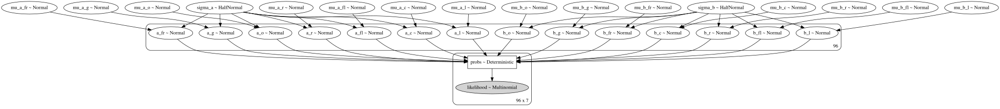

In [46]:
pm.model_to_graphviz(model)

/anaconda/envs/cdf/lib/python3.6/site-packages/matplotlib/axes/_base.py:3455: MatplotlibDeprecationWarning: 
The `ymin` argument was deprecated in Matplotlib 3.0 and will be removed in 3.2. Use `bottom` instead.
  alternative='`bottom`', obj_type='argument')


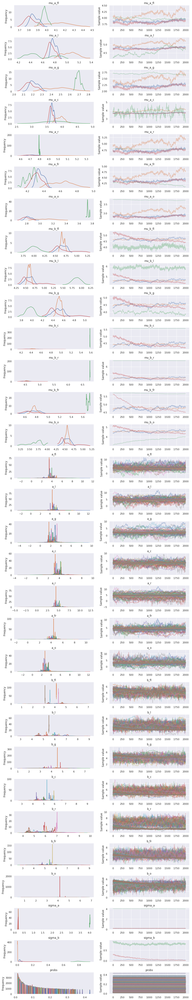

In [47]:
fig = pm.traceplot(trace)
plt.savefig('chains_isolated_univ');

In [63]:
with pm.Model() as one_dim_univariate:
    
    # Hyperpriors for group nodes    
    mu_a = pm.Normal('mu_a', mu=3., sd=1., shape=n_parties)
    sigma_a = pm.HalfNormal('sigma_a', 2., shape=n_parties)
    mu_b = pm.Normal('mu_b', mu=4., sd=1., shape=n_parties)
    sigma_b = pm.HalfNormal('sigma_b', 2., shape=n_parties)
    
    # Centered parametrization
    a = pm.Normal('a', mu=mu_a, sd=sigma_a, shape=(n_dptmts, n_parties)) # nbr of groups * nbr of predicted categories: (96, 7)
    b = pm.Normal('b', mu=mu_b, sd=sigma_b, shape=(n_dptmts, n_parties)) # (96, 7)
    print('a_dept :', a_dept.tag.test_value.shape)
    print('b_dept :', b_dept.tag.test_value.shape)
    
    # Non centered reparametrization
    #a_offset = pm.Normal('a_offset', mu=0., sd=1., shape=(n_dptmts, n_parties))
    #a = pm.Deterministic("a", mu_a + a_offset * sigma_a)
    #b_offset = pm.Normal('b_offset', mu=0., sd=1., shape=(n_dptmts, n_parties))
    #b = pm.Deterministic("b", mu_b + b_offset * sigma_b)

    results_est = a + b * np.expand_dims(xpres17.chomage, axis=1) # (96, 7)
    print('results_est: ', results_est.tag.test_value.shape)
    print(results_est.tag.test_value)
    
    probs = pm.Deterministic('probs', tt.nnet.softmax(results_est))
    print('probs: ', probs.tag.test_value.shape)
    print(probs.tag.test_value)

    likelihood = pm.Multinomial('likelihood', n=ypres17.sum(axis=1), p=probs, observed=ypres17)
    print('likelihood: ', likelihood.tag.test_value.shape)
    print(likelihood.tag.test_value)
    
    trace = pm.sample(2000, tune=1000, cores=4, nuts_kwargs=dict(target_accept=.99), random_seed=RANDOM_SEED)
    #, init='adapt_diag', obj_optimizer=pm.adagrad_window(learning_rate=2e-4))
    
    with open(os.path.join(FOND_FOLDER, 'trace_isolated_univ_same_priors.pkl'), 'wb') as f:
        pickle.dump({'model': one_dim_univariate, 'trace': trace}, f)

a_dept : (96, 7)
b_dept : (96, 7)
results_est:  (96, 7)
[[-1.27557431 -1.27557431 -1.27557431 -1.27557431 -1.27557431 -1.27557431
  -1.27557431]
 [11.85758176 11.85758176 11.85758176 11.85758176 11.85758176 11.85758176
  11.85758176]
 [ 4.60494334  4.60494334  4.60494334  4.60494334  4.60494334  4.60494334
   4.60494334]
 [ 6.76113314  6.76113314  6.76113314  6.76113314  6.76113314  6.76113314
   6.76113314]
 [ 3.82087432  3.82087432  3.82087432  3.82087432  3.82087432  3.82087432
   3.82087432]
 [ 4.60494334  4.60494334  4.60494334  4.60494334  4.60494334  4.60494334
   4.60494334]
 [ 7.74121941  7.74121941  7.74121941  7.74121941  7.74121941  7.74121941
   7.74121941]
 [ 8.13325392  8.13325392  8.13325392  8.13325392  8.13325392  8.13325392
   8.13325392]
 [ 5.78104686  5.78104686  5.78104686  5.78104686  5.78104686  5.78104686
   5.78104686]
 [10.48546098 10.48546098 10.48546098 10.48546098 10.48546098 10.48546098
  10.48546098]
 [-1.66760882 -1.66760882 -1.66760882 -1.66760882 -1.6

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...


likelihood:  (96, 7)
[[ 96100 227500  22599 101600 304100 207100  41000]
 [101900 271000  11600  66800 242000 263300  43400]
 [135800 296800  15700  86500 240200 183200  41800]
 [151500 243600  29100  74200 254700 207100  39800]
 [ 84900 192100  21500  66900 371900 235000  27700]
 [140700 259800  28000  91500 237600 200400  42000]
 [ 92800 289300  12200  75200 244300 245000  41200]
 [168600 343600  28500  66700 187200 167900  37500]
 [ 79300 227900  14100  83699 303300 251200  40500]
 [131500 304100  20900  60400 216300 232200  34600]
 [122600 294400  23400 125500 255100 141000  38000]
 [ 72200 195799  27599 119400 336200 212100  36700]
 [134300 245100  21100  63500 275000 233800  27200]
 [105600 293400  21300 101000 273400 162200  43099]
 [ 89800 308400  15600 111600 286100 151200  37300]
 [113200 327900  18300  88100 230600 177200  44700]
 [103800 284700  22100  90800 281000 174500  43099]
 [138100 267600  15800  88400 249600 197300  43200]
 [105500 429700  13799  69300 215900 133100

Multiprocess sampling (4 chains in 4 jobs)
NUTS: [b, a, sigma_b, mu_b, sigma_a, mu_a]
Sampling 4 chains: 100%|██████████| 12000/12000 [1:02:16<00:00,  2.23draws/s]
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The gelman-rubin statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


In [64]:
with open(os.path.join(FOND_FOLDER, 'trace_isolated_univ_same_priors.pkl'), 'rb') as f:
    data = pickle.load(f)
model, trace = data['model'], data['trace']

In [65]:
model

/anaconda/envs/cdf/lib/python3.6/site-packages/matplotlib/axes/_base.py:3455: MatplotlibDeprecationWarning: 
The `ymin` argument was deprecated in Matplotlib 3.0 and will be removed in 3.2. Use `bottom` instead.
  alternative='`bottom`', obj_type='argument')


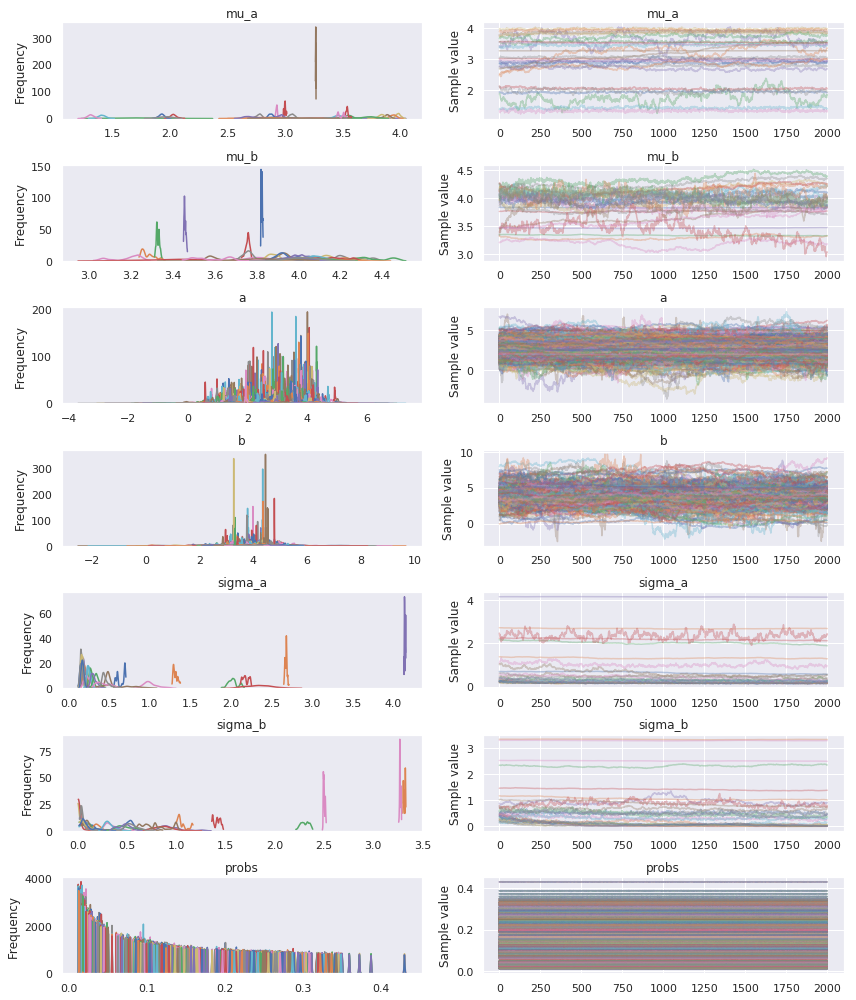

In [66]:
fig = pm.traceplot(trace)
plt.savefig('chains_isolated_univ_same_priors');

In [61]:
with pm.Model() as oneelec_univ_nc:
    
    # fixed priors
    a = pm.Normal('a', mu=0., sd=1., shape=n_parties)
    b = pm.Normal('b', mu=0., sd=1., shape=n_parties)
    print(a.tag.test_value.shape)
    print(a.tag.test_value)
    print(b.tag.test_value.shape)
    print(b.tag.test_value)
    sigma_dept_a = pm.HalfNormal('sigma_dept_a', 2., shape=n_parties)
    sigma_dept_b = pm.HalfNormal('sigma_dept_b', 2., shape=n_parties)
    print(sigma_dept_a.tag.test_value.shape)

    # adapative priors
    a_dept = pm.Normal('a_dept', mu=0., sd=1., shape=(n_dptmts, n_parties)) # (96,7)
    b_dept = pm.Normal('b_dept', mu=0., sd=1., shape=(n_dptmts, n_parties)) # (96,7)
    print(a_dept.tag.test_value.shape)
    print(a_dept.tag.test_value)
    print(b_dept.tag.test_value.shape)
    print(b_dept.tag.test_value)

    A = a + a_dept * sigma_dept_a # (96,7)
    print(A.tag.test_value.shape)
    print(A.tag.test_value)
    B = b + b_dept * sigma_dept_b # (96,7)

    results_est = A + B * np.expand_dims(xpres17.chomage, axis=1) # (96, 7)
    print('results_est: ', results_est.tag.test_value.shape)
    print(results_est.tag.test_value)
    
    probs = pm.Deterministic('probs', tt.nnet.softmax(results_est))
    print('probs: ', probs.tag.test_value.shape)
    print(probs.tag.test_value)

    likelihood = pm.Multinomial('likelihood', n=ypres17.sum(axis=1), p=probs, observed=ypres17)
    print('likelihood: ', likelihood.tag.test_value.shape)
    print(likelihood.tag.test_value)
    
    trace = pm.sample(2000, tune=1000, cores=4, random_seed=RANDOM_SEED)
    #, init='adapt_diag', obj_optimizer=pm.adagrad_window(learning_rate=2e-4), nuts_kwargs=dict(target_accept=.99),
    
    with open(os.path.join(FOND_FOLDER, 'trace_oneelec_univ_nc.pkl'), 'wb') as f:
        pickle.dump({'model': oneelec_univ_nc, 'trace': trace}, f)

results_est:  (96, 7)
[[-0.68893577 -0.68893577 -0.68893577 -0.68893577 -0.68893577 -0.68893577
  -0.68893577]
 [32.1439544  32.1439544  32.1439544  32.1439544  32.1439544  32.1439544
  32.1439544 ]
 [14.01235834 14.01235834 14.01235834 14.01235834 14.01235834 14.01235834
  14.01235834]
 [19.40283284 19.40283284 19.40283284 19.40283284 19.40283284 19.40283284
  19.40283284]
 [12.05218579 12.05218579 12.05218579 12.05218579 12.05218579 12.05218579
  12.05218579]
 [14.01235834 14.01235834 14.01235834 14.01235834 14.01235834 14.01235834
  14.01235834]
 [21.85304853 21.85304853 21.85304853 21.85304853 21.85304853 21.85304853
  21.85304853]
 [22.8331348  22.8331348  22.8331348  22.8331348  22.8331348  22.8331348
  22.8331348 ]
 [16.95261716 16.95261716 16.95261716 16.95261716 16.95261716 16.95261716
  16.95261716]
 [28.71365245 28.71365245 28.71365245 28.71365245 28.71365245 28.71365245
  28.71365245]
 [-1.66902204 -1.66902204 -1.66902204 -1.66902204 -1.66902204 -1.66902204
  -1.66902204]
 

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...


likelihood:  (96, 7)
[[ 96100 227500  22599 101600 304100 207100  41000]
 [101900 271000  11600  66800 242000 263300  43400]
 [135800 296800  15700  86500 240200 183200  41800]
 [151500 243600  29100  74200 254700 207100  39800]
 [ 84900 192100  21500  66900 371900 235000  27700]
 [140700 259800  28000  91500 237600 200400  42000]
 [ 92800 289300  12200  75200 244300 245000  41200]
 [168600 343600  28500  66700 187200 167900  37500]
 [ 79300 227900  14100  83699 303300 251200  40500]
 [131500 304100  20900  60400 216300 232200  34600]
 [122600 294400  23400 125500 255100 141000  38000]
 [ 72200 195799  27599 119400 336200 212100  36700]
 [134300 245100  21100  63500 275000 233800  27200]
 [105600 293400  21300 101000 273400 162200  43099]
 [ 89800 308400  15600 111600 286100 151200  37300]
 [113200 327900  18300  88100 230600 177200  44700]
 [103800 284700  22100  90800 281000 174500  43099]
 [138100 267600  15800  88400 249600 197300  43200]
 [105500 429700  13799  69300 215900 133100

Multiprocess sampling (4 chains in 4 jobs)
NUTS: [b_dept, a_dept, sigma_dept_b, sigma_dept_a, b, a]
Sampling 4 chains:  23%|██▎       | 2810/12000 [02:06<44:56,  3.41draws/s]


RuntimeError: Chain 2 failed.

In [39]:
with pm.Model() as one_dim_multivariate:
    
    # Hyperpriors for group nodes    
    mu_a = pm.Normal('mu_a', mu=3., sd=1.)
    sigma_a = pm.HalfNormal('sigma_a', 2.)
    mu_b = pm.Normal('mu_b', mu=4., sd=1.)
    sigma_b = pm.HalfNormal('sigma_b', 2.)
    
    # Centered parametrization
    a = pm.Normal('a', mu=mu_a, sd=sigma_a, shape=(n_dptmts, n_parties)) # (96, 7)
    b = pm.Normal('b', mu=mu_b, sd=sigma_b, shape=(n_dptmts, n_parties, n_regressors)) # (96, 7, 7)
    
    # Non centered reparametrization
    #a_offset = pm.Normal('a_offset', mu=0., sd=1., shape=(n_dptmts, n_parties))
    #a = pm.Deterministic("a", mu_a + a_offset * sigma_a)
    #b_offset = pm.Normal('b_offset', mu=0., sd=1., shape=(n_dptmts, n_parties, n_regressors))
    #b = pm.Deterministic("b", mu_b + b_offset * sigma_b)

    results_est = a + pm.math.sum(b * np.expand_dims(xpres17, axis=1), axis=2) # (96, 7)
    print('results_est: ', results_est.tag.test_value.shape)
    print(results_est.tag.test_value)
    
    probs = pm.Deterministic('probs', tt.nnet.softmax(results_est))
    print('probs: ', probs.tag.test_value.shape)
    print(probs.tag.test_value)

    likelihood = pm.Multinomial('likelihood', n=ypres17.sum(axis=1), p=probs, observed=ypres17)
    print('likelihood: ', likelihood.tag.test_value.shape)
    print(likelihood.tag.test_value)
    
    trace = pm.sample(8000, tune=4000, cores=4, nuts_kwargs=dict(target_accept=.99), random_seed=RANDOM_SEED)
    #, init='adapt_diag', obj_optimizer=pm.adagrad_window(learning_rate=2e-4))    
    
    with open(os.path.join(FOND_FOLDER, 'trace_one_dim_multivariate.pkl'), 'wb') as f:
        pickle.dump({'model': one_dim_multivariate, 'trace': trace}, f)

results_est:  (96, 7)
[[-2.42197237 -2.42197237 -2.42197237 -2.42197237 -2.42197237 -2.42197237
  -2.42197237]
 [10.7111837  10.7111837  10.7111837  10.7111837  10.7111837  10.7111837
  10.7111837 ]
 [ 3.45854527  3.45854527  3.45854527  3.45854527  3.45854527  3.45854527
   3.45854527]
 [ 5.61473508  5.61473508  5.61473508  5.61473508  5.61473508  5.61473508
   5.61473508]
 [ 2.67447625  2.67447625  2.67447625  2.67447625  2.67447625  2.67447625
   2.67447625]
 [ 3.45854527  3.45854527  3.45854527  3.45854527  3.45854527  3.45854527
   3.45854527]
 [ 6.59482135  6.59482135  6.59482135  6.59482135  6.59482135  6.59482135
   6.59482135]
 [ 6.98685586  6.98685586  6.98685586  6.98685586  6.98685586  6.98685586
   6.98685586]
 [ 4.6346488   4.6346488   4.6346488   4.6346488   4.6346488   4.6346488
   4.6346488 ]
 [ 9.33906292  9.33906292  9.33906292  9.33906292  9.33906292  9.33906292
   9.33906292]
 [-2.81400688 -2.81400688 -2.81400688 -2.81400688 -2.81400688 -2.81400688
  -2.81400688]
 

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...


likelihood:  (96, 7)
[[ 96100 227500  22599 101600 304100 207100  41000]
 [101900 271000  11600  66800 242000 263300  43400]
 [135800 296800  15700  86500 240200 183200  41800]
 [151500 243600  29100  74200 254700 207100  39800]
 [ 84900 192100  21500  66900 371900 235000  27700]
 [140700 259800  28000  91500 237600 200400  42000]
 [ 92800 289300  12200  75200 244300 245000  41200]
 [168600 343600  28500  66700 187200 167900  37500]
 [ 79300 227900  14100  83699 303300 251200  40500]
 [131500 304100  20900  60400 216300 232200  34600]
 [122600 294400  23400 125500 255100 141000  38000]
 [ 72200 195799  27599 119400 336200 212100  36700]
 [134300 245100  21100  63500 275000 233800  27200]
 [105600 293400  21300 101000 273400 162200  43099]
 [ 89800 308400  15600 111600 286100 151200  37300]
 [113200 327900  18300  88100 230600 177200  44700]
 [103800 284700  22100  90800 281000 174500  43099]
 [138100 267600  15800  88400 249600 197300  43200]
 [105500 429700  13799  69300 215900 133100

Multiprocess sampling (4 chains in 4 jobs)
NUTS: [b, a, sigma_b, mu_b, sigma_a, mu_a]
Sampling 4 chains: 100%|██████████| 48000/48000 [10:22:16<00:00,  1.21draws/s]
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The gelman-rubin statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


In [32]:
X.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 1889 entries, (ain, 1992-03-22 00:00:00) to (yvelines, 2017-06-11 00:00:00)
Data columns (total 7 columns):
climat_affaires    1889 non-null float64
conf_menages       1889 non-null float64
prix_gazole        1889 non-null float64
inflation          1889 non-null float64
pib                1889 non-null float64
net_app            1889 non-null float64
chomage            1889 non-null float64
dtypes: float64(7)
memory usage: 185.1+ KB


In [ ]:
with pm.Model() as multidim_univariate:
    
    mu_a = pm.Normal('mu_a', mu=2., sd=1)
    sigma_a = pm.HalfNormal('sigma_a', 2.5)
    mu_b = pm.Normal('mu_b', mu=3., sd=1)
    sigma_b = pm.HalfNormal('sigma_b', 2.5)    
    
    a = pm.Normal('a', mu=mu_a, sd=sigma_a, shape=(n_dptmts, n_parties)) # nbr of groups * nbr of predicted categories: (96, 7)
    b = pm.Normal('b', mu=mu_b, sd=sigma_b, shape=(n_dptmts, n_parties)) # (96, 7)

    results_est = a[dptmts_idx, :] + b[dptmts_idx, :] * np.expand_dims(X['net_app'].values, axis=1) # (2678, 7)
    print('results_est: ', results_est.tag.test_value.shape)
    
    p = pm.Deterministic('p', tt.nnet.softmax(results_est))
    print('p: ', p.tag.test_value.shape)

    likelihood = pm.Multinomial('likelihood', n=y.sum(axis=1), p=p, observed=y.values)
    print('likelihood: ', likelihood.tag.test_value.shape)
    
    trace = pm.sample(2000, tune=1000, cores=4, random_seed=RANDOM_SEED)#, init='adapt_diag', obj_optimizer=pm.adagrad_window(learning_rate=2e-4))
    
    with open(os.path.join(FOND_FOLDER, 'trace_multidim_univariate.pkl'), 'wb') as f:
        pickle.dump({'model': multidim_univariate, 'trace': trace}, f)

In [ ]:
with pm.Model() as multidim_univ_non_centrd:
    
    mu_a = pm.Normal('mu_a', mu=0., sd=1.)
    sigma_a = pm.HalfCauchy('sigma_a', 5.)
    mu_b = pm.Normal('mu_b', mu=0., sd=1.)
    sigma_b = pm.HalfCauchy('sigma_b', 5.)    
    
    a_offset = pm.Normal('a_offset', mu=0, sd=1, shape=(n_dptmts, n_parties))
    a = pm.Deterministic("a", mu_a + a_offset * sigma_a)
    b_offset = pm.Normal('b_offset', mu=0, sd=1, shape=(n_dptmts, n_parties))
    b = pm.Deterministic("b", mu_b + b_offset * sigma_b)

    results_est = a[dptmts_idx, :] + b[dptmts_idx, :] * np.expand_dims(X.chomage, axis=1) # (2678, 7)
    p = pm.Deterministic('p', tt.nnet.softmax(results_est))

    likelihood = pm.Multinomial('likelihood', n=y.sum(axis=1), p=p, observed=y)
    
    trace = pm.sample(5000, tune=2500, cores=4, random_seed=RANDOM_SEED, init='adapt_diag')

In [132]:
fund_hierar_univariate.logp(fund_hierar_univariate.test_point)

array(-inf)

In [133]:
fund_hierar_univariate.check_test_point()

mu_a              -10.130000
sigma_a_log__      -1.140000
mu_b               -5.520000
sigma_b_log__      -1.140000
a               -1699.070000
b               -1699.070000
likelihood              -inf
Name: Log-probability of test_point, dtype: float64

In [160]:
likelihood.tag.test_value[np.where(likelihood.tag.test_value <= 0)[0]]

array([ 124,  156,  214,  292,  714, 1673, 1697])

In [140]:
likelihood.tag.test_value.shape

(1896, 7)

In [138]:
y.sum(axis=1).shape

(1896,)

In [139]:
y.shape

(1896, 7)

In [ ]:
# https://docs.pymc.io/notebooks/Diagnosing_biased_Inference_with_Divergences.html
# https://twiecki.io/blog/2017/02/08/bayesian-hierchical-non-centered/

# TESTER AVEC DES DONNEES ALEATOIRES DANS X
with pm.Model() as multidim_multivariate:
    
    # Hyperpriors for group nodes
    #mu_a = pm.Normal('mu_a', mu=0., sd=100**2)
    #sigma_a = pm.HalfCauchy('sigma_a', 5.)
    #mu_b = pm.Normal('mu_b', mu=0., sd=100**2)
    #sigma_b = pm.HalfCauchy('sigma_b', 5.)
    
    mu_a = pm.Normal('mu_a', mu=2., sd=1.)
    sigma_a = pm.HalfNormal('sigma_a', 2.5)
    mu_b = pm.Normal('mu_b', mu=3.9, sd=1.)
    sigma_b = pm.HalfNormal('sigma_b', 2.5)   
    
    # Prior parameters for each department, distributed around group means mu_a and mu_b
    a = pm.Normal('a', mu=mu_a, sd=sigma_a, shape=(n_dptmts, n_parties)) # (96, 7)
    b = pm.Normal('b', mu=mu_b, sd=sigma_b, shape=(n_dptmts, n_parties, n_regressors)) # (96, 7, 7)
    #print('b initial 1: ', b.tag.test_value)
    # b.ravel().reshape((96, 7, 7))
    
    # Model prediction of results
    # a[dptmts_idx] translates to a[0, 0, 0, 1, 1, ...], with 2678 rows (=n_obs)
    # We thus link multiple regressor measures of a department to its coefficients.
    results_est = a[dptmts_idx, :] + pm.math.sum(b[dptmts_idx, :, :] * np.expand_dims(X, axis=1), axis=2) # (96, 7)
    # on somme le produit de b et X sur le 3ème axe, celui des régresseurs, pour le faire disparaître, car il n'a pas de raison de se retrouver
    # dans l'estimation linéaire à la fin
    print('results_est: ', results_est.tag.test_value.shape)
    
    print('softmax: ', (pm.math.exp(results_est) / pm.math.sum(pm.math.exp(results_est))).tag.test_value.shape)
    #p = pm.Deterministic('p', pm.math.exp(results_est) / pm.math.sum(pm.math.exp(results_est)))
    p = pm.Deterministic('p', tt.nnet.softmax(results_est))
    print('p: ', p.tag.test_value.shape)
    
    likelihood = pm.Multinomial('likelihood', n=y.sum(axis=1), p=p, observed=y)
    print('likelihood: ', likelihood.tag.test_value.shape)
    
    trace = pm.sample(2000, tune=1000, cores=4, random_seed=RANDOM_SEED)
    print('b initial 2: ', b.tag.test_value)
    
    with open(os.path.join(FOND_FOLDER, 'trace_multidim_multivariate.pkl'), 'wb') as f:
        pickle.dump({'model': multidim_multivariate, 'trace': trace}, f)

In [34]:
temp_idx = np.arange(96*7*7).reshape(96,7,7)
temp_idx

array([[[   0,    1,    2, ...,    4,    5,    6],
        [   7,    8,    9, ...,   11,   12,   13],
        [  14,   15,   16, ...,   18,   19,   20],
        ...,
        [  28,   29,   30, ...,   32,   33,   34],
        [  35,   36,   37, ...,   39,   40,   41],
        [  42,   43,   44, ...,   46,   47,   48]],

       [[  49,   50,   51, ...,   53,   54,   55],
        [  56,   57,   58, ...,   60,   61,   62],
        [  63,   64,   65, ...,   67,   68,   69],
        ...,
        [  77,   78,   79, ...,   81,   82,   83],
        [  84,   85,   86, ...,   88,   89,   90],
        [  91,   92,   93, ...,   95,   96,   97]],

       [[  98,   99,  100, ...,  102,  103,  104],
        [ 105,  106,  107, ...,  109,  110,  111],
        [ 112,  113,  114, ...,  116,  117,  118],
        ...,
        [ 126,  127,  128, ...,  130,  131,  132],
        [ 133,  134,  135, ...,  137,  138,  139],
        [ 140,  141,  142, ...,  144,  145,  146]],

       ...,

       [[4557, 4558, 455

In [48]:
np.where(temp_idx==3136)

(array([64]), array([0]), array([0]))

In [49]:
X.iloc[64]

climat_affaires    0.772837
conf_menages       0.812452
prix_gazole       -1.284302
inflation          0.106152
pib                0.183035
net_app            0.303641
chomage            0.352232
Name: (alpesdehauteprovence, 1995-04-23 00:00:00), dtype: float64

In [64]:
multidim_multivariate.check_test_point()

mu_a            -9.200000e-01
sigma_a_log__   -7.700000e-01
mu_b            -9.200000e-01
sigma_b_log__   -7.700000e-01
a               -1.081540e+03
b               -3.260560e+03
likelihood      -3.909267e+08
Name: Log-probability of test_point, dtype: float64

In [61]:
mu_b.tag.test_value

3.9

In [33]:
with pm.Model() as multidim_multiv_non_centrd:
    
    # Hyperpriors for group nodes
    mu_a = pm.Normal('mu_a', mu=0., sd=1.)
    sigma_a = pm.HalfCauchy('sigma_a', 2.5)
    mu_b = pm.Normal('mu_b', mu=0., sd=1.)
    sigma_b = pm.HalfCauchy('sigma_b', 2.5)    
    
    # Prior parameters for each department, distributed around group means mu_a and mu_b
    a_offset = pm.Normal('a_offset', mu=0., sd=1., shape=(n_dptmts, n_parties))
    a = pm.Deterministic("a", mu_a + a_offset * sigma_a)
    
    b_offset = pm.Normal('b_offset', mu=0., sd=1., shape=(n_dptmts, n_parties, n_regressors))
    b = pm.Deterministic("b", mu_b + b_offset * sigma_b)
    
    # Model prediction of results
    # a[dptmts_idx] translates to a[0, 0, 0, 1, 1, ...], with 2678 rows (=n_obs)
    # We thus link multiple regressor measures of a department to its coefficients.
    results_est = a[dptmts_idx, :] + pm.math.sum(b[dptmts_idx, :, :] * np.expand_dims(X, axis=1), axis=2) # (96, 7)
    # on somme le produit de b et X sur le 3ème axe, celui des régresseurs, pour le faire disparaître, car il n'a pas de raison de se retrouver
    # dans l'estimation linéaire à la fin
    print('results_est: ', results_est.tag.test_value.shape)
    
    print('softmax: ', (pm.math.exp(results_est) / pm.math.sum(pm.math.exp(results_est))).tag.test_value.shape)
    #p = pm.Deterministic('p', pm.math.exp(results_est) / pm.math.sum(pm.math.exp(results_est)))
    p = pm.Deterministic('p', tt.nnet.softmax(results_est))
    print('p: ', p.tag.test_value.shape)
    
    likelihood = pm.Multinomial('likelihood', n=y.sum(axis=1), p=p, observed=y)
    print('likelihood: ', likelihood.tag.test_value.shape)
    
    trace = pm.sample(draws=2000, tune=1000, cores=4, init='adapt_diag', nuts_kwargs=dict(target_accept=.90), random_seed=RANDOM_SEED)
    with open(os.path.join(FOND_FOLDER, 'trace_fund.pkl'), 'wb') as f:
        pickle.dump({'model': multidim_multiv_non_centrd, 'trace': trace}, f)

results_est:  (1889, 7)
softmax:  (1889, 7)
p:  (1889, 7)


Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...


likelihood:  (1889, 7)


Multiprocess sampling (4 chains in 4 jobs)
NUTS: [b_offset, a_offset, sigma_b, mu_b, sigma_a, mu_a]
Sampling 4 chains:  17%|█▋        | 2081/12000 [2:17:14<65:54:40, 23.92s/draws]


ValueError: Not enough samples to build a trace.

In [59]:
# REGARDER EGALEMENT CES MODELES: https://discourse.pymc.io/t/pymc3-on-aws-ec2/641/8 et https://stackoverflow.com/questions/31673350/softmax-choice-probabilities-with-categorical-in-pymc3#

(2678, 7)

## Test new parametrization after Junpeng's advice

In [7]:
temps_folder = "/Users/alexandreandorra/Desktop/temp_funds"

In [122]:
X_full = pd.read_json(os.path.join(FOND_FOLDER, 'X_full.json'))
X_full = X_full.set_index(['date', 'departement']).sort_index().filter(like='pres', axis=0)
X_pres12 = X_full.loc[X_full.index.get_level_values(0).unique()[-1]].sort_index()
X_full = X_full.loc[X_full.index.get_level_values(0).unique()[:-1]].swaplevel().sort_index()
'''X_full = X_full.swaplevel().sort_index()\
            .loc[: pd.to_datetime('2011/12/31')]\
            .swaplevel().sort_index()'''
# X12.sort_values(['departement', 'date']).query('date >= "2012" and date < "2013"').set_index(['departement', 'date'])
X_full.head()

climat_affaires  conf_menages  prix_gazole  inflation  \
departement date                                                              
ain         pres1995         0.772837      0.812452    -1.284302   0.106152   
            pres2002        -0.137191      1.209888    -0.721568   0.106152   
            pres2007         1.314981      0.116938     0.298387   0.231691   
aisne       pres1995         0.772837      0.812452    -1.284302   0.106152   
            pres2002        -0.137191      1.209888    -0.721568   0.106152   

                           pib   net_app   chomage  
departement date                                    
ain         pres1995  0.183035  0.303641 -0.921881  
            pres2002 -0.180828  0.670587 -2.146988  
            pres2007  0.852689 -0.339662 -1.803958  
aisne       pres1995  0.183035  0.303641  1.430326  
            pres2002 -0.180828  0.670587  0.450240

In [114]:
dptmts_idx, dptmts_names = X_full.index.get_level_values(0).factorize(sort=True)
n_dptmts = len(dptmts_names)
date_idx, date_names = X_full.index.get_level_values(1).factorize(sort=True)
_, n_regressors = X_full.shape

X_full.shape

(288, 7)

In [126]:
results = pd.read_json(os.path.join(FOND_FOLDER, 'Y_full.json'))
results = results.set_index(['date', 'departement']).sort_index().filter(like='pres', axis=0)
res_pres12 = results.loc[results.index.get_level_values(0).unique()[1]].sort_index()
results = results.loc[results.index.get_level_values(0).unique()[:-1]].swaplevel().sort_index()
results.head()

farleft    left   green  center   right  farright  \
departement date                                                          
ain         pres1995   0.1104  0.2050  0.0391  0.1980  0.1923    0.1986   
            pres2002   0.1129  0.1264  0.0513  0.0773  0.1718    0.2186   
            pres2007   0.0458  0.2067  0.0299  0.1962  0.3450    0.1228   
aisne       pres1995   0.1673  0.2438  0.0243  0.1563  0.1817    0.1769   
            pres2002   0.1755  0.1536  0.0358  0.0534  0.1882    0.2122   

                       other  
departement date              
ain         pres1995  0.0566  
            pres2002  0.2417  
            pres2007  0.0536  
aisne       pres1995  0.0497  
            pres2002  0.1813

In [130]:
y_full = (results.copy() * 10000).astype(int) # transform proportions to multinomial observations
_, n_parties = y_full.shape
y_full.head()

farleft  left  green  center  right  farright  other
departement date                                                          
ain         pres1995     1104  2050    391    1980   1923      1986    566
            pres2002     1129  1264    513     773   1718      2186   2417
            pres2007      458  2067    299    1962   3450      1228    536
aisne       pres1995     1673  2438    243    1563   1817      1769    497
            pres2002     1755  1536    358     534   1882      2122   1813

In [131]:
y_full.shape

(288, 7)

In [132]:
# make sure there is no missing data here
# national regressors: fixed by department but varying per election
# groupX = X_full.loc['seinemaritime', :].iloc[:, :n_regressors-1].values
groupX = X_full.loc['nord', :].iloc[:, :n_regressors-1].values # every regressors except chomage
groupX

array([[ 0.77283701,  0.81245208, -1.28430195,  0.1061517 ,  0.18303475,
         0.3036406 ],
       [-0.13719071,  1.20988843, -0.72156796,  0.1061517 , -0.18082815,
         0.6705868 ],
       [ 1.31498119,  0.11693848,  0.29838739,  0.23169124,  0.85268895,
        -0.33966195]])

In [164]:
'''X_full_shared = theano.shared(X_full.values)
groupX_shared = theano.shared(groupX)
chomage_shared = theano.shared(X_full['chomage'].values)
y_full_shared = theano.shared(y_full.values)'''

In [135]:
groupX12 = X_pres12.iloc[0, :n_regressors-1].values
dptmts12_idx, dptmts12_names = X_pres12.index.factorize(sort=True)
date12_idx = np.zeros(len(dptmts12_idx), dtype=int)
groupX12

array([-0.46634967, -0.97601147,  1.77556411,  0.7338494 , -0.66653775,
       -0.68711413])

In [239]:
# TESTER GELMAN'S PARAMETRIZATION
# TURN REGRESSORS INTO CATEGORIES
# MODEL AN ADDITIONAL CLUSTER: THE TYPE OF ELECTION (BEST SOLUTION, BUT HOW?)
# ADD MEASUREMENT ERROR ON PREDICTORS

In [150]:
with pm.Model() as hier_model:
    
    sigma_dpt_interp = pm.HalfNormal('sigma_dpt_interp', 10.)
    #nu_dpt_interp = pm.Exponential('nu_dpt_interp', 1./29.) + 1.
    
    sigma_fixed = pm.HalfNormal('sigma_fixed', 10.)
    #nu_fixed = pm.Exponential('nu_fixed', 1./29.) + 1.
    
    sigma_random = pm.HalfNormal('sigma_random', 10.)
    #nu_random = pm.Exponential('nu_random', 1./29.) + 1.
    
    dpt_interp = pm.Normal('dpt_interp', 0., sigma_dpt_interp, shape=(n_dptmts, n_parties-1))
    #dpt_interp = pm.Cauchy('dpt_interp', alpha=0., beta=sigma_dpt_interp, shape=(n_dptmts, n_parties-1))
    #dpt_interp = pm.StudentT('dpt_interp', mu=0., sd=sigma_dpt_interp, nu=nu_dpt_interp, shape=(n_dptmts, n_parties-1))
    print('dpt_interp: ', dpt_interp.tag.test_value.shape)
    
    fixed_effect = pm.Normal('fixed_effect', 0., sigma_fixed, shape=(n_regressors-1, n_parties-1))
    #fixed_effect = pm.Cauchy('fixed_effect', alpha=0., beta=sigma_fixed, shape=(n_regressors-1, n_parties-1))
    #fixed_effect = pm.StudentT('fixed_effect', mu=0., sd=sigma_fixed, nu=nu_fixed, shape=(n_regressors-1, n_parties-1))
    print('fixed_effect: ', fixed_effect.tag.test_value.shape)
    
    random_effect = pm.Normal('random_effect', 0., sigma_random, shape=n_parties-1)
    #random_effect = pm.Cauchy('random_effect', alpha=0., beta=sigma_random, shape=n_parties-1)
    #random_effect = pm.StudentT('random_effect', mu=0., sd=sigma_random, nu=nu_random, shape=n_parties-1)
    print('random_effect: ', random_effect.tag.test_value.shape)
    
    results_est = dpt_interp[dptmts_idx]\
                    + tt.dot(groupX, fixed_effect)[date_idx]\
                    + X_full['chomage'].values[:, None] * random_effect
    results_est = tt.concatenate(tensor_list=[results_est, 
                                              tt.zeros((X_full.shape[0], 1))], 
                                 axis=1)
    print('results_est: ', results_est.tag.test_value.shape)
    
    probs = pm.Deterministic('probs', tt.nnet.softmax(results_est))
    print('probs: ', probs.tag.test_value.shape)
    likelihood = pm.Multinomial('likelihood',
                                n=y_full.sum(axis=1),
                                p=probs,
                                observed=y_full.values)
    
    # OOS prediction
    results_oos = dpt_interp[dptmts12_idx]\
                    + (groupX12[None, :] * fixed_effect)[date12_idx]\
                    + X_pres12['chomage'].values[:, None] * random_effect
    results_oos = tt.concatenate(tensor_list=[results_oos, 
                                              tt.zeros((X_pres12.shape[0], 1))], 
                                 axis=1)
    print('results_oos: ', results_oos.tag.test_value.shape)
    
    oos_probs = pm.Deterministic('oos_probs', tt.nnet.softmax(results_oos))
    print('oos_probs: ', oos_probs.tag.test_value.shape)
    
    # might need to increase tunning
    trace = pm.sample(1000, tune=2000, cores=4, random_seed=RANDOM_SEED)

dpt_interp:  (96, 6)
fixed_effect:  (6, 6)
random_effect:  (6,)
results_est:  (288, 7)
probs:  (288, 7)


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...


results_oos:  (96, 7)
oos_probs:  (96, 7)


Multiprocess sampling (4 chains in 4 jobs)
NUTS: [random_effect, fixed_effect, dpt_interp, sigma_random, sigma_fixed, sigma_dpt_interp]
Sampling 4 chains: 100%|██████████| 12000/12000 [1:34:02<00:00,  2.11draws/s]
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The gelman-rubin statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.


In [148]:
# ENREGISTREMENT DE LA TRACE !
#with open(os.path.join(FOND_FOLDER, 'new_sep_elec.pkl'), 'wb') as f:
    pickle.dump({'model': hier_model, 'trace': trace}, f)

In [5]:
# LECTURE DE LA TRACE
with open(os.path.join(FOND_FOLDER, 'new_simple.pkl'), 'rb') as f:
    data = pickle.load(f)
model, trace = data['model'], data['trace']

EOFError: Ran out of input

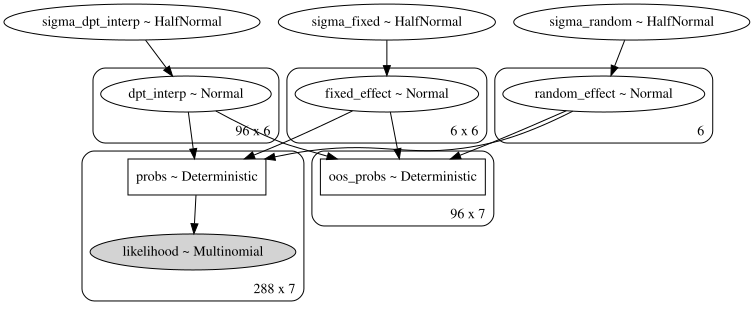

In [151]:
pm.model_to_graphviz(hier_model)

In [152]:
hier_model.basic_RVs

[sigma_dpt_interp_log__,
 sigma_fixed_log__,
 sigma_random_log__,
 dpt_interp,
 fixed_effect,
 random_effect,
 likelihood]

In [153]:
hier_model.check_test_point()

sigma_dpt_interp_log__        -0.77
sigma_fixed_log__             -0.77
sigma_random_log__            -0.77
dpt_interp                 -1725.54
fixed_effect                -107.85
random_effect                -17.97
likelihood               -520499.81
Name: Log-probability of test_point, dtype: float64

In [154]:
print("BFMI (values smaller than 0.2 indicate poor sampling): ", np.round(pm.bfmi(trace), 3))

BFMI (values smaller than 0.2 indicate poor sampling):  1.008


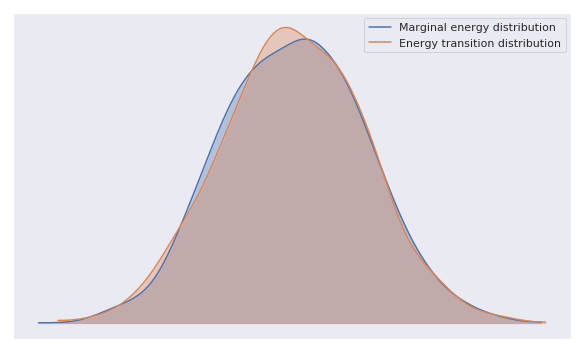

In [155]:
pm.energyplot(trace, figsize=(10,6));

In [20]:
pm.summary(trace, varnames=['random_effect', 'fixed_effect'])

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,Rhat
random_effect__0,0.395680,0.002053,0.000059,0.391822,0.399818,1172.590933,1.003673
random_effect__1,0.191100,0.001735,0.000050,0.187606,0.194310,1247.471792,1.002620
random_effect__2,0.127014,0.002437,0.000063,0.122353,0.131792,1507.018866,1.000207
random_effect__3,0.719240,0.001978,0.000053,0.715591,0.723225,1257.287730,1.001388
random_effect__4,0.194905,0.001691,0.000043,0.191400,0.198059,1324.972584,1.001150
random_effect__5,0.414042,0.001977,0.000055,0.410354,0.417917,1201.919442,1.001855
fixed_effect__0_0,-0.023723,0.002161,0.000059,-0.027989,-0.019383,1492.646554,1.001038
fixed_effect__0_1,0.124196,0.001772,0.000045,0.120807,0.127769,1582.212817,0.999835
fixed_effect__0_2,-0.070022,0.002437,0.000052,-0.074916,-0.065420,1928.584205,1.000426
fixed_effect__0_3,-0.097548,0.001991,0.000051,-0.101403,-0.093629,1728.068473,0.999953


In [21]:
df_trace = pm.trace_to_dataframe(trace)
df_trace.shape

(4000, 13841)

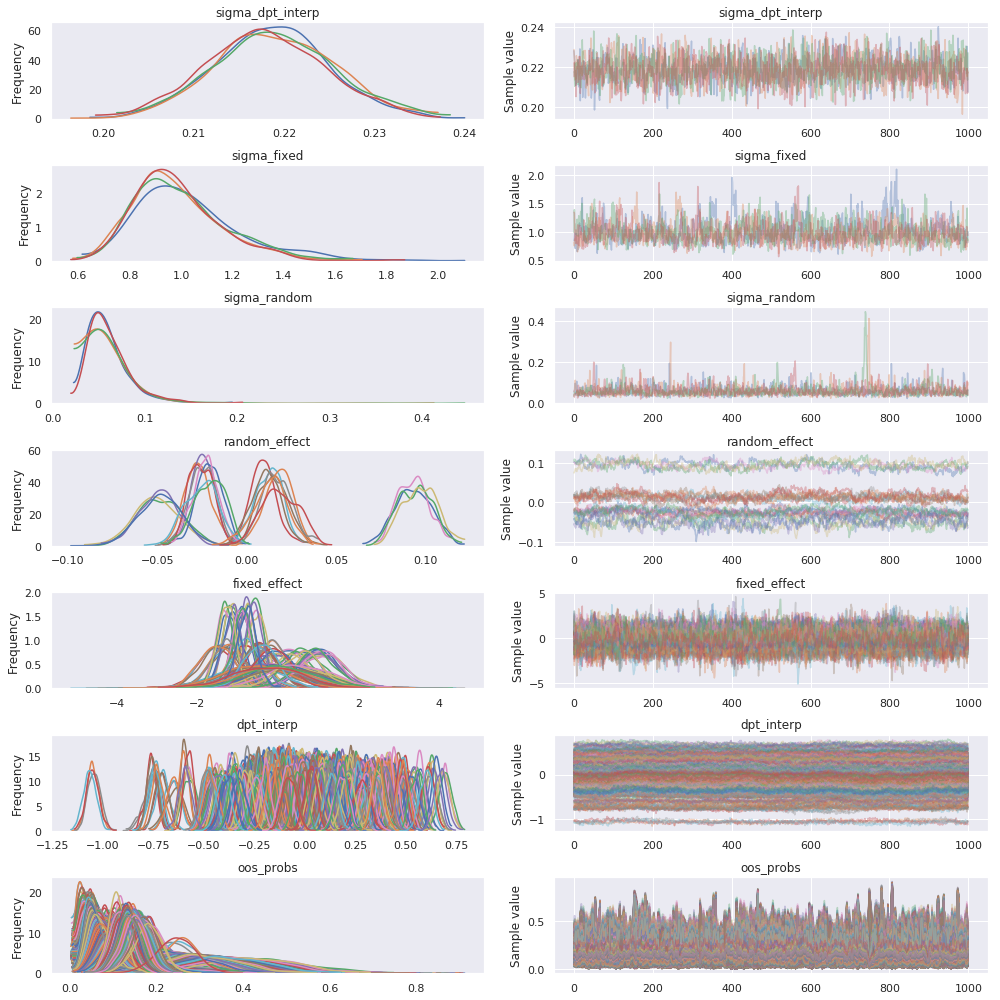

In [156]:
pm.traceplot(trace, varnames=['sigma_dpt_interp', 'sigma_fixed', 'sigma_random', 
                              'random_effect', 'fixed_effect', 'dpt_interp', 'oos_probs'], 
             figsize=(14, 14));
#pm.traceplot(trace, varnames=['random_effect', 'fixed_effect', 'dpt_interp'], 
 #            figsize=(14, 14));
#plt.savefig('chains_new_simple');

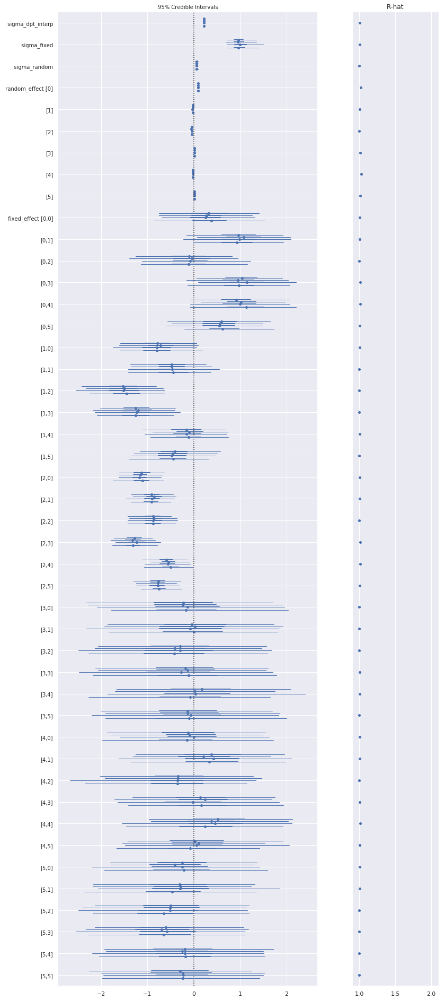

In [157]:
plt.figure(figsize=(15,30))
pm.forestplot(trace, varnames=['sigma_dpt_interp', 'sigma_fixed', 'sigma_random', 'random_effect', 'fixed_effect']);
#pm.forestplot(trace, varnames=['random_effect', 'fixed_effect']);
#plt.savefig('forest_new_simple');

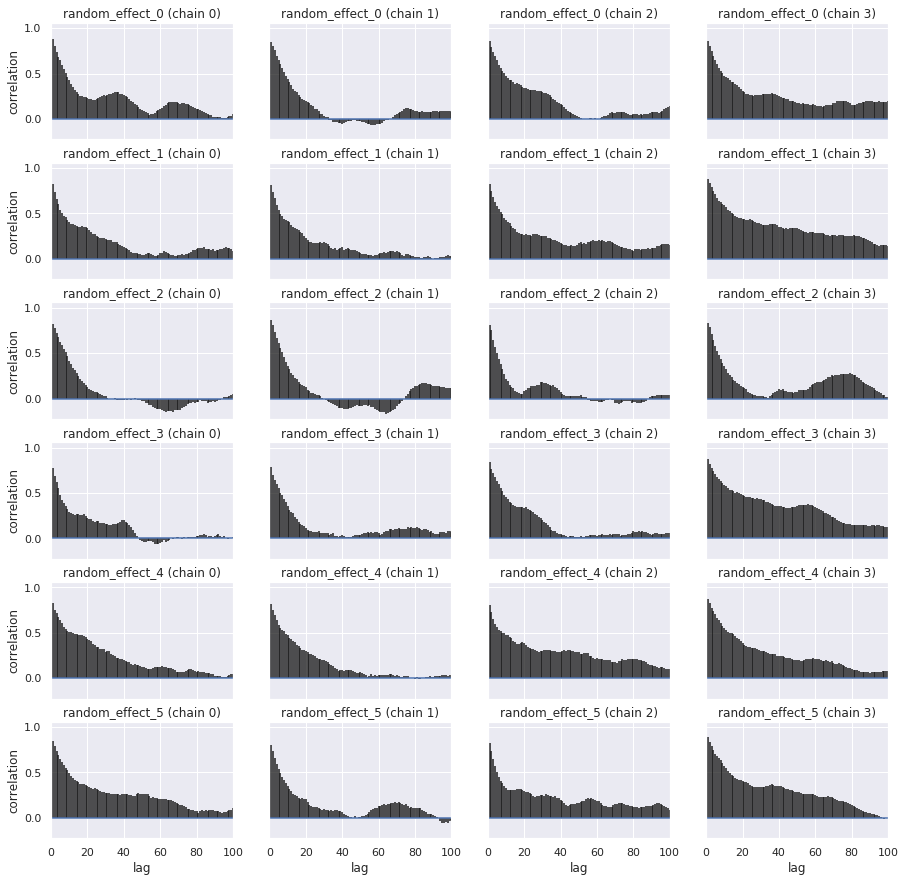

In [158]:
pm.autocorrplot(trace, varnames=['random_effect'], figsize=(15,15));

In [159]:
#pm.plot_posterior(trace, varnames=['random_effect', 'fixed_effect'], alpha_level=0.17);
pm.plot_posterior(trace, varnames=['oos_probs'], alpha_level=0.17, ref_val=res12.values.flatten().tolist());

In [160]:
sim_data = pm.sample_posterior_predictive(trace=trace, samples=2000, model=hier_model, random_seed=RANDOM_SEED)
rdm_pt = np.random.randint(len(y_full) + 1)
reals, simuls = y_full.iloc[rdm_pt].values, sim_data['likelihood'][:, rdm_pt, :].T

100%|██████████| 2000/2000 [00:29<00:00, 67.24it/s]


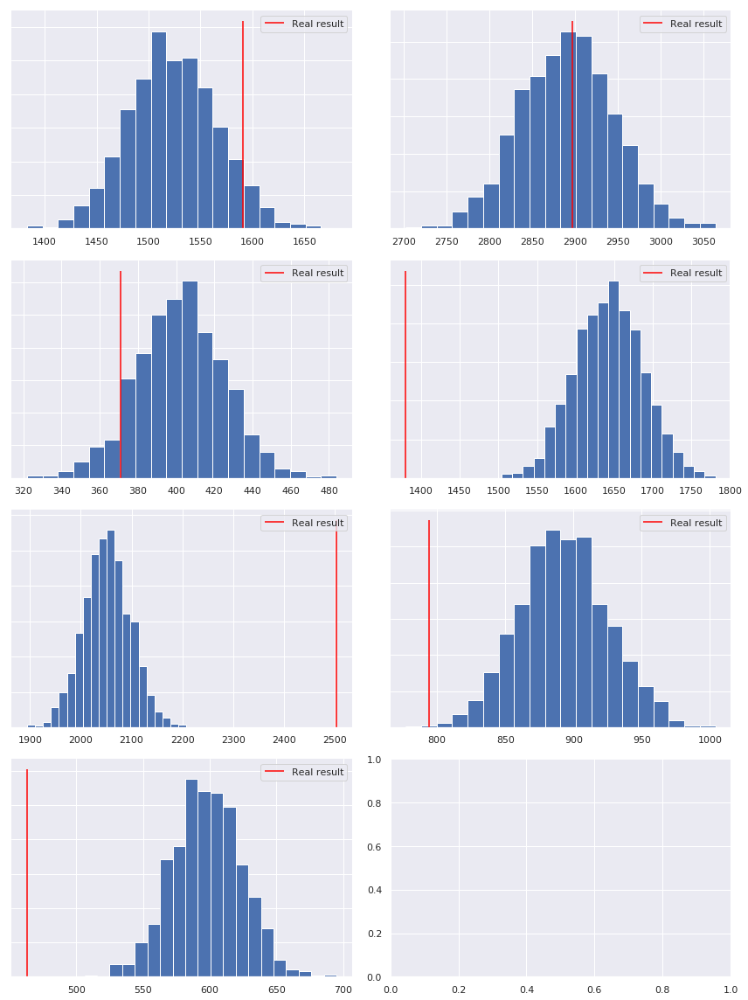

In [161]:
fig, axes = plt.subplots(4, 2, figsize=(12,16))
axes_flat = axes.flatten()

for ax, real, sim in zip(axes_flat, reals, simuls):
    ax.hist(sim, bins=20)
    ax.vlines(real, *ax.get_ylim(), colors='red', label='Real result')
    ax.set_yticklabels([])
    sns.despine(left=True)
    ax.legend();

plt.tight_layout()
#plt.savefig('ppc_new_simple');

In [192]:
X12 = pd.read_json(os.path.join("/Users/alexandreandorra/Desktop/temp_funds", 'X_full.json'))
X12 = X12.sort_values(['departement', 'date']).query('date >= "2012" and date < "2013"').set_index(['departement', 'date'])
X12.head()

,,climat_affaires,conf_menages,prix_gazole,inflation,pib,net_app,chomage
departement,date,,,,,,,
ain,2012-04-22,-0.46635,-0.976011,1.775564,0.733849,-0.666538,-0.687114,-1.068894
aisne,2012-04-22,-0.46635,-0.976011,1.775564,0.733849,-0.666538,-0.687114,2.214395
allier,2012-04-22,-0.46635,-0.976011,1.775564,0.733849,-0.666538,-0.687114,0.401236
alpesdehauteprovence,2012-04-22,-0.46635,-0.976011,1.775564,0.733849,-0.666538,-0.687114,0.940283
alpesmaritimes,2012-04-22,-0.46635,-0.976011,1.775564,0.733849,-0.666538,-0.687114,0.205219


In [221]:
groupX12 = X12.iloc[0, :n_regressors-1].values
groupX_shared.set_value(groupX12[None, :])

chomage_shared.set_value(X12['chomage'].values)

y_full_shared.set_value(np.ones(X12.shape, dtype=np.int))

In [223]:
dptmts_idx, dptmts_names = X12.index.get_level_values(0).factorize(sort=True)
date_idx, date_names = X12.index.get_level_values(1).factorize(sort=True)

In [224]:
with hier_model:
    post_pred = pm.sample_posterior_predictive(trace, samples=500)

  0%|          | 0/500 [00:00<?, ?it/s]


IndexError: index 1 is out of bounds for size 1
Apply node that caused the error: AdvancedSubtensor1(Dot22.0, TensorConstant{[ 0  1  2 .. 15 16 17]})
Toposort index: 4
Inputs types: [TensorType(float64, matrix), TensorType(int64, vector)]
Inputs shapes: [(1, 6), (1605,)]
Inputs strides: [(48, 8), (8,)]
Inputs values: ['not shown', 'not shown']
Outputs clients: [[Elemwise{Composite{(i0 + i1 + (i2 * i3))}}[(0, 0)](AdvancedSubtensor1.0, AdvancedSubtensor1.0, InplaceDimShuffle{0,x}.0, InplaceDimShuffle{x,0}.0)]]

Backtrace when the node is created(use Theano flag traceback.limit=N to make it longer):
  File "/anaconda/envs/fund/lib/python3.7/site-packages/ipykernel/zmqshell.py", line 536, in run_cell
    return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
  File "/anaconda/envs/fund/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 2819, in run_cell
    raw_cell, store_history, silent, shell_futures)
  File "/anaconda/envs/fund/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 2845, in _run_cell
    return runner(coro)
  File "/anaconda/envs/fund/lib/python3.7/site-packages/IPython/core/async_helpers.py", line 67, in _pseudo_sync_runner
    coro.send(None)
  File "/anaconda/envs/fund/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3020, in run_cell_async
    interactivity=interactivity, compiler=compiler, result=result)
  File "/anaconda/envs/fund/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3185, in run_ast_nodes
    if (yield from self.run_code(code, result)):
  File "/anaconda/envs/fund/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3267, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-165-145d616e9b0e>", line 29, in <module>
    + chomage_shared[:, None] * random_effect

HINT: Use the Theano flag 'exception_verbosity=high' for a debugprint and storage map footprint of this apply node.